In [1]:
import torch
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import PolynomialLR
from torch.utils.data import WeightedRandomSampler
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2

from tqdm.notebook import tqdm
import json
import cv2
import numpy as np
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import  plot_some_images ,read_images , pre_hard_skeletonize , pre_soft_skeletonize,compute_confution_matrix
from utils.preprocessing import WhiteTopHat , CLAHE , normalize_xca
from utils.dataset import  UnetDataset , ValidUnetDataset
from models.nnunet import nnUnet
from models.nnunet_blocks import nnUnetv2
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###

# Training

In [2]:
args = {
    "base_path" : "../arcade/nnUnet_dataset/syntax",
    "in_c" : 1,
    "base_channel" :32,
    "image_shape" : (512,512),
    "class_count" : 26 ,
    "attention" : True,
    "k":40,
    "batch_size" : 10,
    "num_workers" : 10,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "lr" : 0.01,
    "momentum" : 0.99,
    "weight_decay" : 3e-5,
    "epcohs":200,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "input_channels":1,
    "unet_depth":4,
    "loss_type":"tversky loss",
    "alpha":0.3,
    "beta":0.7,
    "t_gamma":2.00,
    "f_gamma":2.0,
    "f_loss_scale":1,
    "loss_coefs":{"CE":0.5,"Second":1.0},
    "output_base_path" : "./outputs",
    "name" : "Attention7-DSV-tev-new_augs_full-4",
    "deep_super_vision" : True,
    "f_alpha":None
}
class_map = {
    1: '1',2: '2', 3: '3',4: '4',
    5: '5',6: '6',7: '7',8: '8',
    9: '9',10: '9a',11: '10',12: '10a',
    13: '11',14: '12',15: '12a',16: '13',
    17: '14',18: '14a',19: '15',20: '16',
    21: '16a',22: '16b',23: '16c',
    24: '12b',25: '14b'
}
train_class_counts = [
    1000,374,375,369,303,525,525,
    340,310,198,70,21,1,320,61,
    129,305,107,49,38,232,43,48,31,63,127
]
# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","CE loss",args["loss_type"]]
out_counts = 4 if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights

[1.0, 0.5, 0.25, 0.125]

In [ ]:
def class_weighting(method,class_counts,**kwargs):
    if(kwargs["use_pixel_counts"]):
        print("using pixel counts")
        with open("./data/train_class_counts.json","r") as f:
            train_class_counts = json.load(f)
        counts = [0]*(len(train_class_counts))
        for k,v in train_class_counts.items():
            counts[int(k)] = int(v)
        counts = np.array(counts,dtype=np.float64)
    else :
        print("using class counts")
        counts = np.array(class_counts,dtype=np.float64)

    if(method=="median"):
        print("median weights being used")
        median_count = np.median(counts)
        weights = median_count/np.array(counts)
        
    elif(method=="log"):
        print("log weights being used")
        total = np.sum(counts)
        weights = np.log(total/np.array(counts))
        weights = (weights / weights.mean())
        weights[0]=0.1
    elif(method=="beta"):
        print("beta weights being used")
        b = kwargs["b"]
        weights = (1-b)/(1-np.power(b,counts))
        weights = weights / weights.sum()
        weights[12] = 0.25
    else:
        print("no class weights being used")
        return None
    return weights.tolist()
args["f_alpha"] = class_weighting(method="median",class_counts=train_class_counts,b=0.999999,use_pixel_counts=False)
args["f_alpha"]

using class counts
log weights being used


[0.1,
 0.7142043884888621,
 0.7135157199921257,
 0.7176755875744286,
 0.7684995730881661,
 0.626737444448145,
 0.626737444448145,
 0.7387854746678001,
 0.762609126532027,
 0.8782298337841749,
 1.146393423398511,
 1.4569054728038624,
 2.2421066818356166,
 0.754420940433312,
 1.181886829838206,
 0.9887309378139343,
 0.7668028156603474,
 1.0369551595622082,
 1.238382102391938,
 1.3039506626242363,
 0.8373593505238325,
 1.2720698571238491,
 1.243699944376071,
 1.3564600952472932,
 1.1735665534939475,
 0.9927608041591397]

In [4]:
# pre_soft_skeletonize(args["base_path"],output_path=args["base_path"],batch_size=10,k=40)

In [5]:
train_transforms = A.Compose([
    # A.Resize(*args["image_shape"]),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.7),


    A.Affine(
        scale=(0.8, 1.2),             
        translate_percent=(-0.1, 0.1), 
        rotate=(-30, 30),         
        shear=(-10, 10),      
        

        fill=0,           
        fill_mask=0,                 
        border_mode=cv2.BORDER_CONSTANT, 
        
        fit_output=False,  
        p=0.7
    ),

    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),

    A.RandomBrightnessContrast(
        brightness_limit=0.2, 
        contrast_limit=0.2, 
        p=0.5
    ),

    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    
    A.Lambda(image=normalize_xca)
])
test_transforms = A.Compose([
    # A.Resize(*args["image_shape"]),
    A.Lambda(image=normalize_xca),
    ToTensorV2()
    ]  
)
# train_preprocess = v2.Compose([
#     WhiteTopHat(kernel_size=(50,50)),
#     CLAHE()
    
# ])
train_preprocess = None


In [6]:
def make_dataloader(data,args,valid=False,sampler_weights=None):
    if(sampler_weights is not None):
        print("using weighted sampler here")
        sampler = WeightedRandomSampler(sampler_weights, len(sampler_weights))
        dataloader = DataLoader(
            data,
            batch_size = args["batch_size"] ,
            num_workers = args["num_workers"] ,
            pin_memory=True,
            shuffle=False,
            sampler=sampler
        )
        
    else : 
        if(valid):
            print("valid with no sampler")
            dataloader = DataLoader(
                data,
                batch_size = args["batch_size"] ,
                num_workers = args["num_workers"] ,
                pin_memory=True,
                shuffle=False,
            )
        else : 
            print("train with no sampler")
            dataloader = DataLoader(
                data,
                batch_size = args["batch_size"] ,
                num_workers = args["num_workers"] ,
                pin_memory=True,
                shuffle=True
            )
    return dataloader

In [7]:

train_images,sampler_weights = read_images(
    base_path = args["base_path"],
    preprocessor = train_preprocess,
    part = "train",
    train_class_counts=np.array(train_class_counts)
)
valid_images = read_images(
    base_path = args["base_path"],
    preprocessor = train_preprocess,
    part = "val",
    train_class_counts=None
)
train_ds = UnetDataset(transform = train_transforms,data = train_images,base_size=args["image_shape"][0],out_counts=out_counts)
valid_ds = ValidUnetDataset(transform = test_transforms,data = valid_images)

train_loader = make_dataloader(train_ds,args,valid=False,sampler_weights=sampler_weights)
valid_loader = make_dataloader(valid_ds,args,valid=True,sampler_weights=None)

max count is :  525
NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

using weighted sampler here
valid with no sampler


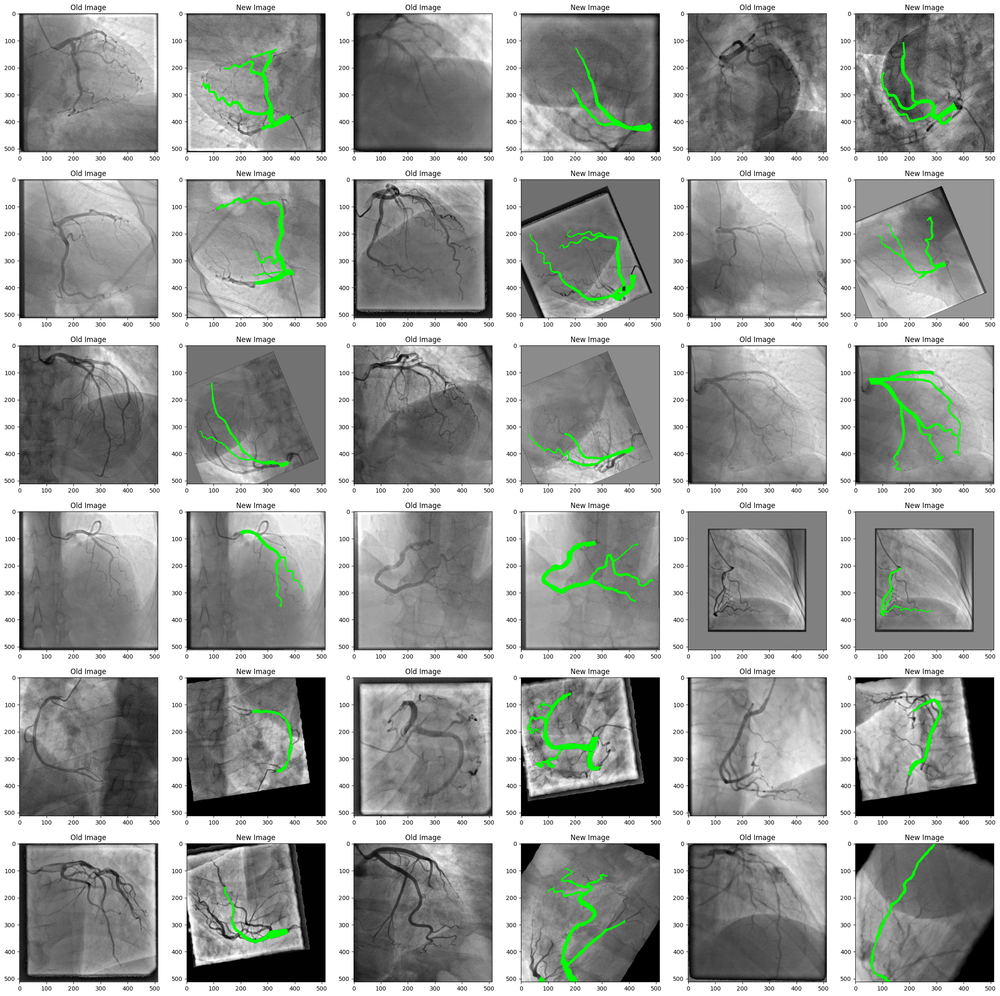

In [8]:
plot_some_images(train_images, train_transforms, image_counts=36, fig_shape=(6,6), base_transforms=test_transforms)

In [9]:
model = nnUnet(args).to(args["device"])
loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(model.parameters(), lr=args["lr"])
optimizer = torch.optim.SGD(
    model.parameters(),
    momentum=args["momentum"],
    lr=args["lr"],
    nesterov=True,
    weight_decay=args["weight_decay"]
)
lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map)

best_model =trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)

number of layers : 4
encoder settings :  [32, 64, 128, 256]
bottle-neck settings :  512
decoder settings :  [256, 128, 64]
head settings :  26
loss is set to tversky


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.01
train ==> epcoh (0)
total loss : 3.1412496423721312 - CE loss : 1.3047663033008576 - tversky loss : 1.8364833509922027

train avg metrics for epoch 0 :
avg dice : 0.0014150782121590455 - avg precision : 0.0019889450422488153 - avg recall : 0.004168982437440718
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 1.4706696331501008 - CE loss : 0.4948077917098999 - tversky loss : 0.975861844420433

valid avg metrics for epoch 0 :
avg dice : 4.2089329715727303e-13 - avg precision : 0.0 - avg recall : 0.0
------------------------------------------------------------
New Best! : dice = 4.2089332778598443e-13


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.5415, device='cuda:0')
current lr : 0.009955
train ==> epcoh (1)
total loss : 2.730645306110382 - CE loss : 0.923789187669754 - tversky loss : 1.8068561220169068

train avg metrics for epoch 1 :
avg dice : 0.0010342327505766292 - avg precision : 0.0024666741490364076 - avg recall : 0.0006542804837226867
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 1.4277358889579772 - CE loss : 0.46049354672431947 - tversky loss : 0.9672423422336578

valid avg metrics for epoch 1 :
avg dice : 0.002163616568268305 - avg precision : 0.0016387593746185303 - avg recall : 0.0031830862164497374
------------------------------------------------------------
New Best! : dice = 0.0021636164747178555


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00991
train ==> epcoh (2)
total loss : 2.635177719593048 - CE loss : 0.8565305376052856 - tversky loss : 1.7786471593379973

train avg metrics for epoch 2 :
avg dice : 0.008458564281504191 - avg precision : 0.012976150214672088 - avg recall : 0.014615840017795563
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 1.4049171686172486 - CE loss : 0.44459275901317596 - tversky loss : 0.9603244125843048

valid avg metrics for epoch 2 :
avg dice : 0.013786606193004734 - avg precision : 0.010196655988693237 - avg recall : 0.024036327600479124
------------------------------------------------------------
New Best! : dice = 0.01378660649061203


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009865
train ==> epcoh (3)
total loss : 2.591931004524231 - CE loss : 0.8383026045560836 - tversky loss : 1.7536284005641938

train avg metrics for epoch 3 :
avg dice : 0.012782919704953419 - avg precision : 0.008813094198703766 - avg recall : 0.03484867572784424
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 1.3896022498607636 - CE loss : 0.43133888244628904 - tversky loss : 0.958263349533081

valid avg metrics for epoch 3 :
avg dice : 0.008917530775488826 - avg precision : 0.005134614109992981 - avg recall : 0.03387450933456421
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00982
train ==> epcoh (4)
total loss : 2.5361335706710815 - CE loss : 0.8085737806558609 - tversky loss : 1.7275597846508026

train avg metrics for epoch 4 :
avg dice : 0.009155882895032483 - avg precision : 0.007535216510295868 - avg recall : 0.037455007657408716
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 1.3881815195083618 - CE loss : 0.43260317891836164 - tversky loss : 0.9555783420801163

valid avg metrics for epoch 4 :
avg dice : 0.010981101096091421 - avg precision : 0.007255124300718308 - avg recall : 0.0388550092279911
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009775
train ==> epcoh (5)
total loss : 2.48069429397583 - CE loss : 0.7791185414791107 - tversky loss : 1.701575745344162

train avg metrics for epoch 5 :
avg dice : 0.008332315032644106 - avg precision : 0.010930325090885162 - avg recall : 0.03812555842916481
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 1.375904369354248 - CE loss : 0.42267911285161974 - tversky loss : 0.9532252460718155

valid avg metrics for epoch 5 :
avg dice : 0.007320211855526949 - avg precision : 0.00418595977127552 - avg recall : 0.035766631655569654
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00973
train ==> epcoh (6)
total loss : 2.415653414726257 - CE loss : 0.7603595578670501 - tversky loss : 1.6552938413619995

train avg metrics for epoch 6 :
avg dice : 0.008291977550876274 - avg precision : 0.005763451829552651 - avg recall : 0.03698085027281195
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 1.3718242585659026 - CE loss : 0.42003073543310165 - tversky loss : 0.9517935395240784

valid avg metrics for epoch 6 :
avg dice : 0.008246120438394072 - avg precision : 0.00571454793214798 - avg recall : 0.03689209239557385
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009684
train ==> epcoh (7)
total loss : 2.335474944114685 - CE loss : 0.7333148378133774 - tversky loss : 1.602160108089447

train avg metrics for epoch 7 :
avg dice : 0.010259553024703154 - avg precision : 0.010417871773242951 - avg recall : 0.03743676948644861
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 1.3586160838603973 - CE loss : 0.4100686401128769 - tversky loss : 0.948547437787056

valid avg metrics for epoch 7 :
avg dice : 0.014548749802384138 - avg precision : 0.014426898807287217 - avg recall : 0.040583081647237125
------------------------------------------------------------
New Best! : dice = 0.01454874873161316


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009639
train ==> epcoh (8)
total loss : 2.2731387591362 - CE loss : 0.7250430798530578 - tversky loss : 1.548095715045929

train avg metrics for epoch 8 :
avg dice : 0.015828468981820137 - avg precision : 0.01693999335169792 - avg recall : 0.040941849590453785
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 1.3462170004844665 - CE loss : 0.4043456256389618 - tversky loss : 0.9418713808059692

valid avg metrics for epoch 8 :
avg dice : 0.0179842129953296 - avg precision : 0.015049866773188115 - avg recall : 0.04866689619528188
------------------------------------------------------------
New Best! : dice = 0.017984213307499886


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009594
train ==> epcoh (9)
total loss : 2.211407500505447 - CE loss : 0.7044743537902832 - tversky loss : 1.5069331634044647

train avg metrics for epoch 9 :
avg dice : 0.02544113918022336 - avg precision : 0.021327987909317017 - avg recall : 0.06377227819575637
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 1.3330210149288177 - CE loss : 0.4020650669932365 - tversky loss : 0.9309559404850006

valid avg metrics for epoch 9 :
avg dice : 0.026258623153378822 - avg precision : 0.01873741954565048 - avg recall : 0.07264352321624756
1 => dice : 7.779618827396736e-14 p : 0.0 , r : 0.0
2 => dice : 7.042799096733734e-14 p : 0.0 , r : 0.0
3 => dice : 8.138749277384477e-14 p : 0.0 , r : 0.0
4 => dice : 1.142556779439377e-13 p : 0.0 , r : 0.0
5 => dice : 6.149040423977098e-14 p : 0.0 , r : 0.0
6 => dice : 0.2397235482931137 p : 0.1414082646369934 , r : 0.7866449952125549
7 => dice : 6.751829726824726e-14 p : 0.0 , r : 0.0
8 => dice : 0

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009549
train ==> epcoh (10)
total loss : 2.136319531202316 - CE loss : 0.676022002696991 - tversky loss : 1.4602975392341613

train avg metrics for epoch 10 :
avg dice : 0.0349372346589022 - avg precision : 0.02768064334988594 - avg recall : 0.09622480942605761
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (10)
total loss : 1.2963289678096772 - CE loss : 0.38770064562559126 - tversky loss : 0.9086283206939697

valid avg metrics for epoch 10 :
avg dice : 0.035686723916253944 - avg precision : 0.024713577926158904 - avg recall : 0.1010918068839237
------------------------------------------------------------
New Best! : dice = 0.03568672016263008


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009504
train ==> epcoh (11)
total loss : 2.057885763645172 - CE loss : 0.6565714353322982 - tversky loss : 1.401314352750778

train avg metrics for epoch 11 :
avg dice : 0.05826083533469197 - avg precision : 0.04148653626441955 - avg recall : 0.13375164680182933
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (11)
total loss : 1.27904514670372 - CE loss : 0.3949883982539177 - tversky loss : 0.8840567499399186

valid avg metrics for epoch 11 :
avg dice : 0.04804246380954007 - avg precision : 0.034163012374192475 - avg recall : 0.12734176963567734
------------------------------------------------------------
New Best! : dice = 0.04804246500134468


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009458
train ==> epcoh (12)
total loss : 1.9697084212303162 - CE loss : 0.6176886561512948 - tversky loss : 1.3520197796821594

train avg metrics for epoch 12 :
avg dice : 0.08549217977796973 - avg precision : 0.09768586724996567 - avg recall : 0.17273969383793883
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (12)
total loss : 1.2397240161895753 - CE loss : 0.38355063647031784 - tversky loss : 0.8561733871698379

valid avg metrics for epoch 12 :
avg dice : 0.08096688739983549 - avg precision : 0.0926108319312334 - avg recall : 0.15196719650179147
------------------------------------------------------------
New Best! : dice = 0.08096688985824585


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009413
train ==> epcoh (13)
total loss : 1.8673391580581664 - CE loss : 0.5851789855957031 - tversky loss : 1.2821601903438569

train avg metrics for epoch 13 :
avg dice : 0.1356971132326233 - avg precision : 0.12979862600564956 - avg recall : 0.21203971486276715
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (13)
total loss : 1.155003196001053 - CE loss : 0.3567647963762283 - tversky loss : 0.7982384115457535

valid avg metrics for epoch 13 :
avg dice : 0.11903483614349838 - avg precision : 0.10754521153867244 - avg recall : 0.18112237121909858
------------------------------------------------------------
New Best! : dice = 0.11903483420610428


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2485, device='cuda:0')
current lr : 0.009368
train ==> epcoh (14)
total loss : 1.7920992159843445 - CE loss : 0.5636422827839851 - tversky loss : 1.2284569346904755

train avg metrics for epoch 14 :
avg dice : 0.18447923747358438 - avg precision : 0.17692438341677189 - avg recall : 0.2580864103883505
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (14)
total loss : 1.0961072266101837 - CE loss : 0.3586703047156334 - tversky loss : 0.7374369353055954

valid avg metrics for epoch 14 :
avg dice : 0.1568964219653584 - avg precision : 0.15365601301193238 - avg recall : 0.2393700755108148
------------------------------------------------------------
New Best! : dice = 0.1568964123725891


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009322
train ==> epcoh (15)
total loss : 1.665980530977249 - CE loss : 0.5473844385147095 - tversky loss : 1.1185961031913758

train avg metrics for epoch 15 :
avg dice : 0.23635729916395792 - avg precision : 0.22727277785539626 - avg recall : 0.3102599485684186
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (15)
total loss : 0.9988498270511628 - CE loss : 0.32126971185207365 - tversky loss : 0.6775801181793213

valid avg metrics for epoch 15 :
avg dice : 0.20513618657374713 - avg precision : 0.19374891097657382 - avg recall : 0.26646220008842647
------------------------------------------------------------
New Best! : dice = 0.20513617992401123


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009277
train ==> epcoh (16)
total loss : 1.610645614862442 - CE loss : 0.5445834830403328 - tversky loss : 1.066062136888504

train avg metrics for epoch 16 :
avg dice : 0.28449071062729026 - avg precision : 0.2643338234722614 - avg recall : 0.3475206433376297
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (16)
total loss : 0.9780614674091339 - CE loss : 0.31895764321088793 - tversky loss : 0.6591038197278977

valid avg metrics for epoch 16 :
avg dice : 0.2342108786107155 - avg precision : 0.21318771336227654 - avg recall : 0.2973442293703556
------------------------------------------------------------
New Best! : dice = 0.23421087861061096


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009232
train ==> epcoh (17)
total loss : 1.5606110155582429 - CE loss : 0.5201443848013878 - tversky loss : 1.0404666352272034

train avg metrics for epoch 17 :
avg dice : 0.3119081320613648 - avg precision : 0.2811922858655453 - avg recall : 0.3711703546717763
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (17)
total loss : 0.9292639404535293 - CE loss : 0.31741865277290343 - tversky loss : 0.6118452772498131

valid avg metrics for epoch 17 :
avg dice : 0.253272883445096 - avg precision : 0.22554826125502586 - avg recall : 0.3212250803411007
------------------------------------------------------------
New Best! : dice = 0.2532728910446167


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009186
train ==> epcoh (18)
total loss : 1.5480494856834413 - CE loss : 0.5326609468460083 - tversky loss : 1.015388543009758

train avg metrics for epoch 18 :
avg dice : 0.3203858238458659 - avg precision : 0.2826221361756325 - avg recall : 0.3836519334837794
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (18)
total loss : 0.9062361598014832 - CE loss : 0.29932268932461736 - tversky loss : 0.6069134667515754

valid avg metrics for epoch 18 :
avg dice : 0.25449978236114906 - avg precision : 0.2650410280749202 - avg recall : 0.3031844080379233
------------------------------------------------------------
New Best! : dice = 0.25449979305267334


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009141
train ==> epcoh (19)
total loss : 1.465176019668579 - CE loss : 0.5011443594098091 - tversky loss : 0.964031662940979

train avg metrics for epoch 19 :
avg dice : 0.3405371236614883 - avg precision : 0.29825541108846665 - avg recall : 0.40839317059144375
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (19)
total loss : 0.8809186160564423 - CE loss : 0.29712788239121435 - tversky loss : 0.583790734410286

valid avg metrics for epoch 19 :
avg dice : 0.27034487560407094 - avg precision : 0.24031847778707743 - avg recall : 0.33781125009059904
1 => dice : 0.6018664836883545 p : 0.5459468960762024 , r : 0.670548677444458
2 => dice : 0.569317102432251 p : 0.6682547926902771 , r : 0.4958975613117218
3 => dice : 0.5856698751449585 p : 0.5338979363441467 , r : 0.648560643196106
4 => dice : 0.3880940079689026 p : 0.3010598123073578 , r : 0.5459136366844177
5 => dice : 0.6962918043136597 p : 0.6620447039604187 , r : 0.7342753410339355
6 => dice : 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009095
train ==> epcoh (20)
total loss : 1.4018019419908523 - CE loss : 0.48532147228717804 - tversky loss : 0.9164804726839065

train avg metrics for epoch 20 :
avg dice : 0.3597135789319873 - avg precision : 0.31929890662431715 - avg recall : 0.4332236252306029
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (20)
total loss : 0.8615968972444534 - CE loss : 0.2908809930086136 - tversky loss : 0.5707159101963043

valid avg metrics for epoch 20 :
avg dice : 0.2816066741198819 - avg precision : 0.2857425414025784 - avg recall : 0.35288459848612547
------------------------------------------------------------
New Best! : dice = 0.28160667419433594


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.6361, device='cuda:0')
current lr : 0.00905
train ==> epcoh (21)
total loss : 1.4290285855531693 - CE loss : 0.4946539716422558 - tversky loss : 0.9343746191263199

train avg metrics for epoch 21 :
avg dice : 0.35520964458584786 - avg precision : 0.31304485112428665 - avg recall : 0.42937752686440944
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (21)
total loss : 0.8507505387067795 - CE loss : 0.2846911236643791 - tversky loss : 0.5660594210028649

valid avg metrics for epoch 21 :
avg dice : 0.277234475836231 - avg precision : 0.25266066923737523 - avg recall : 0.3685762387234718
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009004
train ==> epcoh (22)
total loss : 1.3613761031627656 - CE loss : 0.46650256872177126 - tversky loss : 0.8948735404014587

train avg metrics for epoch 22 :
avg dice : 0.3656073671160266 - avg precision : 0.320243097692728 - avg recall : 0.4481478426465765
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (22)
total loss : 0.8971767872571945 - CE loss : 0.3183360330760479 - tversky loss : 0.578840757906437

valid avg metrics for epoch 22 :
avg dice : 0.2761941248034645 - avg precision : 0.2629685167968273 - avg recall : 0.3294204150603036
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008959
train ==> epcoh (23)
total loss : 1.3728639876842499 - CE loss : 0.4664680337905884 - tversky loss : 0.906395953297615

train avg metrics for epoch 23 :
avg dice : 0.3737315430119634 - avg precision : 0.3364515759050846 - avg recall : 0.44864433895796535
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (23)
total loss : 0.8500980317592621 - CE loss : 0.28222293481230737 - tversky loss : 0.5678750976920128

valid avg metrics for epoch 23 :
avg dice : 0.27937365132865916 - avg precision : 0.2672490656003356 - avg recall : 0.34760741479229185
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008913
train ==> epcoh (24)
total loss : 1.3501899141073226 - CE loss : 0.46292115688323976 - tversky loss : 0.8872687655687332

train avg metrics for epoch 24 :
avg dice : 0.3721690757322358 - avg precision : 0.3288496527355164 - avg recall : 0.4489209566739737
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (24)
total loss : 0.8276219964027405 - CE loss : 0.27345274239778516 - tversky loss : 0.554169262945652

valid avg metrics for epoch 24 :
avg dice : 0.28620367648096573 - avg precision : 0.26588302917778495 - avg recall : 0.3649519154429436
------------------------------------------------------------
New Best! : dice = 0.28620368242263794


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008868
train ==> epcoh (25)
total loss : 1.3503288453817368 - CE loss : 0.4617317724227905 - tversky loss : 0.8885970610380173

train avg metrics for epoch 25 :
avg dice : 0.37433930538594723 - avg precision : 0.3310738232731819 - avg recall : 0.45056608840823176
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (25)
total loss : 0.8115347295999527 - CE loss : 0.27555775120854376 - tversky loss : 0.5359769850969315

valid avg metrics for epoch 25 :
avg dice : 0.31070007197561705 - avg precision : 0.30057237826287747 - avg recall : 0.3753208050690591
------------------------------------------------------------
New Best! : dice = 0.31070005893707275


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008822
train ==> epcoh (26)
total loss : 1.307038227915764 - CE loss : 0.4546608325839043 - tversky loss : 0.8523773896694183

train avg metrics for epoch 26 :
avg dice : 0.38558360941708086 - avg precision : 0.34262050449848175 - avg recall : 0.4616038737632334
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (26)
total loss : 0.781883281469345 - CE loss : 0.25940053090453147 - tversky loss : 0.5224827572703361

valid avg metrics for epoch 26 :
avg dice : 0.3023494745418828 - avg precision : 0.27739132031798364 - avg recall : 0.39284487009048463
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008776
train ==> epcoh (27)
total loss : 1.2845332098007203 - CE loss : 0.44655902475118636 - tversky loss : 0.8379741698503494

train avg metrics for epoch 27 :
avg dice : 0.39210528863593935 - avg precision : 0.3465832206606865 - avg recall : 0.47061870897188784
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (27)
total loss : 0.8408701360225678 - CE loss : 0.2913296289741993 - tversky loss : 0.5495405048131943

valid avg metrics for epoch 27 :
avg dice : 0.306485770493776 - avg precision : 0.2979847998917103 - avg recall : 0.36774144537746906
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008731
train ==> epcoh (28)
total loss : 1.2419095236063002 - CE loss : 0.42576590955257415 - tversky loss : 0.8161436098814011

train avg metrics for epoch 28 :
avg dice : 0.4057102619111538 - avg precision : 0.35884662747383117 - avg recall : 0.48436412565410136
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (28)
total loss : 0.795029091835022 - CE loss : 0.2774673357605934 - tversky loss : 0.5175617590546608

valid avg metrics for epoch 28 :
avg dice : 0.316942611169692 - avg precision : 0.2895016415417194 - avg recall : 0.4047344563246588
------------------------------------------------------------
New Best! : dice = 0.31694260239601135


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008685
train ==> epcoh (29)
total loss : 1.2010524892807006 - CE loss : 0.40910438627004625 - tversky loss : 0.7919481092691422

train avg metrics for epoch 29 :
avg dice : 0.4146208292245865 - avg precision : 0.3633285404741764 - avg recall : 0.4967199820280075
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (29)
total loss : 0.7690379202365876 - CE loss : 0.25535420700907707 - tversky loss : 0.5136837080121041

valid avg metrics for epoch 29 :
avg dice : 0.3212169256609637 - avg precision : 0.29582886417862025 - avg recall : 0.3950597908592317
1 => dice : 0.6543393135070801 p : 0.6478235125541687 , r : 0.6609875559806824
2 => dice : 0.6547359824180603 p : 0.6203824877738953 , r : 0.693117082118988
3 => dice : 0.6259778738021851 p : 0.5790456533432007 , r : 0.6811888813972473
4 => dice : 0.4457378685474396 p : 0.3799942135810852 , r : 0.5389897227287292
5 => dice : 0.6538563966751099 p : 0.6505313515663147 , r : 0.6572155952453613
6 => dice 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008639
train ==> epcoh (30)
total loss : 1.2185024690628052 - CE loss : 0.41841684728860856 - tversky loss : 0.8000856137275696

train avg metrics for epoch 30 :
avg dice : 0.415058384090662 - avg precision : 0.3691339930891991 - avg recall : 0.4933448289334774
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (30)
total loss : 0.7383499920368195 - CE loss : 0.23591891452670097 - tversky loss : 0.502431084215641

valid avg metrics for epoch 30 :
avg dice : 0.33169969477235467 - avg precision : 0.30806443127337846 - avg recall : 0.4132459352491423
------------------------------------------------------------
New Best! : dice = 0.3316996693611145


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.4379, device='cuda:0')
--- Total Norm ---
tensor(1.9608, device='cuda:0')
current lr : 0.008594
train ==> epcoh (31)
total loss : 1.2164230787754058 - CE loss : 0.40996741205453874 - tversky loss : 0.8064556682109832

train avg metrics for epoch 31 :
avg dice : 0.41270389571785926 - avg precision : 0.3633177971839905 - avg recall : 0.4923858696222305
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (31)
total loss : 0.7791972398757935 - CE loss : 0.26291006356477736 - tversky loss : 0.5162871733307839

valid avg metrics for epoch 31 :
avg dice : 0.31856742579492653 - avg precision : 0.29876872450113295 - avg recall : 0.39226235296577217
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008548
train ==> epcoh (32)
total loss : 1.1864421105384826 - CE loss : 0.4032753160595894 - tversky loss : 0.7831668025255203

train avg metrics for epoch 32 :
avg dice : 0.4214805870503187 - avg precision : 0.3713930821418762 - avg recall : 0.4984541667252779
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (32)
total loss : 0.7417845666408539 - CE loss : 0.24682030230760574 - tversky loss : 0.4949642613530159

valid avg metrics for epoch 32 :
avg dice : 0.3352764578164805 - avg precision : 0.30173756629228593 - avg recall : 0.41846030063927175
------------------------------------------------------------
New Best! : dice = 0.33527645468711853


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008502
train ==> epcoh (33)
total loss : 1.150457563996315 - CE loss : 0.39388328671455386 - tversky loss : 0.7565742707252503

train avg metrics for epoch 33 :
avg dice : 0.4345744803547859 - avg precision : 0.3852542594075203 - avg recall : 0.5122275380790233
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (33)
total loss : 0.7519789725542069 - CE loss : 0.2571156144142151 - tversky loss : 0.49486335963010786

valid avg metrics for epoch 33 :
avg dice : 0.3351613263786238 - avg precision : 0.32074450224637985 - avg recall : 0.41667208638042214
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.6680, device='cuda:0')
current lr : 0.008456
train ==> epcoh (34)
total loss : 1.1698679965734482 - CE loss : 0.39279236003756524 - tversky loss : 0.77707563996315

train avg metrics for epoch 34 :
avg dice : 0.4252281931042671 - avg precision : 0.3718220642209053 - avg recall : 0.5057492035627366
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (34)
total loss : 0.7759842157363892 - CE loss : 0.2566284768283367 - tversky loss : 0.5193557411432266

valid avg metrics for epoch 34 :
avg dice : 0.31399443170243535 - avg precision : 0.2899505125021096 - avg recall : 0.4021666120609734
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00841
train ==> epcoh (35)
total loss : 1.1308258080482483 - CE loss : 0.38912756606936455 - tversky loss : 0.7416982471942901

train avg metrics for epoch 35 :
avg dice : 0.4388773253560066 - avg precision : 0.38946099936962125 - avg recall : 0.5180775022506714
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (35)
total loss : 0.7211964100599288 - CE loss : 0.2427942596375942 - tversky loss : 0.4784021511673927

valid avg metrics for epoch 35 :
avg dice : 0.35024321372622164 - avg precision : 0.335763919679448 - avg recall : 0.42028457089792937
------------------------------------------------------------
New Best! : dice = 0.3502432107925415


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008364
train ==> epcoh (36)
total loss : 1.1195512974262238 - CE loss : 0.3840697215497494 - tversky loss : 0.7354815828800202

train avg metrics for epoch 36 :
avg dice : 0.4395057977735996 - avg precision : 0.3896710965037346 - avg recall : 0.5159312233328819
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (36)
total loss : 0.737803453207016 - CE loss : 0.2421899102628231 - tversky loss : 0.49561354219913484

valid avg metrics for epoch 36 :
avg dice : 0.330628228709237 - avg precision : 0.3098860493302345 - avg recall : 0.4192788291722536
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008318
train ==> epcoh (37)
total loss : 1.077137758731842 - CE loss : 0.3613301940262318 - tversky loss : 0.7158075594902038

train avg metrics for epoch 37 :
avg dice : 0.45198340773582457 - avg precision : 0.40058729380369185 - avg recall : 0.533223820924759
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (37)
total loss : 0.7181555300951004 - CE loss : 0.23813602328300476 - tversky loss : 0.4800195023417473

valid avg metrics for epoch 37 :
avg dice : 0.35303968496631116 - avg precision : 0.32890395402908323 - avg recall : 0.42871924459934235
------------------------------------------------------------
New Best! : dice = 0.3530397117137909


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008272
train ==> epcoh (38)
total loss : 1.0682850307226182 - CE loss : 0.3611107189953327 - tversky loss : 0.7071743166446686

train avg metrics for epoch 38 :
avg dice : 0.46104951173067094 - avg precision : 0.4076917210221291 - avg recall : 0.5417097517848015
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (38)
total loss : 0.7139066636562348 - CE loss : 0.24040356203913688 - tversky loss : 0.4735030964016914

valid avg metrics for epoch 38 :
avg dice : 0.35349745467316895 - avg precision : 0.3202153244614601 - avg recall : 0.4311052531003952
------------------------------------------------------------
New Best! : dice = 0.3534974753856659


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008227
train ==> epcoh (39)
total loss : 1.06235833466053 - CE loss : 0.35448463886976245 - tversky loss : 0.7078737038373947

train avg metrics for epoch 39 :
avg dice : 0.46605784714221954 - avg precision : 0.4154313373565674 - avg recall : 0.5463912343978882
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (39)
total loss : 0.6981696873903275 - CE loss : 0.23318222165107727 - tversky loss : 0.4649874702095985

valid avg metrics for epoch 39 :
avg dice : 0.3610972684575245 - avg precision : 0.37074421271681784 - avg recall : 0.4434844084549695
1 => dice : 0.7126700282096863 p : 0.6913652420043945 , r : 0.7353295683860779
2 => dice : 0.6687687635421753 p : 0.6145901679992676 , r : 0.7334229946136475
3 => dice : 0.6437167525291443 p : 0.5680280327796936 , r : 0.7426771521568298
4 => dice : 0.4810931086540222 p : 0.3685086965560913 , r : 0.6927322149276733
5 => dice : 0.7572866082191467 p : 0.716069757938385 , r : 0.8035381436347961
6 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9018, device='cuda:0')
current lr : 0.008181
train ==> epcoh (40)
total loss : 1.061006257534027 - CE loss : 0.36519192293286323 - tversky loss : 0.6958143293857575

train avg metrics for epoch 40 :
avg dice : 0.4678595298528671 - avg precision : 0.4139441937208176 - avg recall : 0.5499041593074798
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (40)
total loss : 0.7076413422822952 - CE loss : 0.24299534261226655 - tversky loss : 0.4646460011601448

valid avg metrics for epoch 40 :
avg dice : 0.3657877878100699 - avg precision : 0.33374446131289004 - avg recall : 0.4456581972539425
------------------------------------------------------------
New Best! : dice = 0.3657878041267395


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008134
train ==> epcoh (41)
total loss : 1.0593484646081925 - CE loss : 0.3565992368757725 - tversky loss : 0.7027492380142212

train avg metrics for epoch 41 :
avg dice : 0.465655510276556 - avg precision : 0.4121363127231598 - avg recall : 0.5470475105941296
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (41)
total loss : 0.705066442489624 - CE loss : 0.24544314593076705 - tversky loss : 0.45962329506874083

valid avg metrics for epoch 41 :
avg dice : 0.36756452217708613 - avg precision : 0.3405171865224838 - avg recall : 0.43942438542842865
------------------------------------------------------------
New Best! : dice = 0.36756449937820435


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008088
train ==> epcoh (42)
total loss : 1.0583779710531234 - CE loss : 0.3691420578956604 - tversky loss : 0.6892359030246734

train avg metrics for epoch 42 :
avg dice : 0.4679353702068329 - avg precision : 0.4126194852590561 - avg recall : 0.553257649242878
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (42)
total loss : 0.6952032804489136 - CE loss : 0.23648596182465553 - tversky loss : 0.45871732085943223

valid avg metrics for epoch 42 :
avg dice : 0.3698764422537 - avg precision : 0.33853391736745836 - avg recall : 0.4538652667403221
------------------------------------------------------------
New Best! : dice = 0.3698764741420746


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008042
train ==> epcoh (43)
total loss : 1.0241761714220048 - CE loss : 0.3469043043255806 - tversky loss : 0.6772718688845635

train avg metrics for epoch 43 :
avg dice : 0.48032030880451204 - avg precision : 0.425686871111393 - avg recall : 0.5648037543892861
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (43)
total loss : 0.6938530296087265 - CE loss : 0.23618408665060997 - tversky loss : 0.45766894817352294

valid avg metrics for epoch 43 :
avg dice : 0.3644909099024896 - avg precision : 0.32512346058152614 - avg recall : 0.4499658244336024
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007996
train ==> epcoh (44)
total loss : 0.9836923658847809 - CE loss : 0.3353744535148144 - tversky loss : 0.648317920267582

train avg metrics for epoch 44 :
avg dice : 0.48801865965127944 - avg precision : 0.4281196516752243 - avg recall : 0.5774160432815552
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (44)
total loss : 0.69040507376194 - CE loss : 0.23691927194595336 - tversky loss : 0.45348580479621886

valid avg metrics for epoch 44 :
avg dice : 0.3798357638717759 - avg precision : 0.34805534571409225 - avg recall : 0.44588759064674377
------------------------------------------------------------
New Best! : dice = 0.3798357844352722


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00795
train ==> epcoh (45)
total loss : 1.023596435189247 - CE loss : 0.3488078273832798 - tversky loss : 0.6747886034846305

train avg metrics for epoch 45 :
avg dice : 0.4979740181565285 - avg precision : 0.44148099958896636 - avg recall : 0.5810485383868218
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (45)
total loss : 0.6879845231771469 - CE loss : 0.23308467715978623 - tversky loss : 0.4548998475074768

valid avg metrics for epoch 45 :
avg dice : 0.37716714501391324 - avg precision : 0.3423876230418682 - avg recall : 0.44020765453577043
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007904
train ==> epcoh (46)
total loss : 0.9857110607624054 - CE loss : 0.34070326283574104 - tversky loss : 0.6450077998638153

train avg metrics for epoch 46 :
avg dice : 0.49980841904878615 - avg precision : 0.4396548771858215 - avg recall : 0.5894731190800667
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (46)
total loss : 0.690732792019844 - CE loss : 0.2389295369386673 - tversky loss : 0.4518032521009445

valid avg metrics for epoch 46 :
avg dice : 0.36719188809405395 - avg precision : 0.3329753002524376 - avg recall : 0.45269719392061236
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007858
train ==> epcoh (47)
total loss : 0.9983008849620819 - CE loss : 0.33969389587640764 - tversky loss : 0.6586069792509079

train avg metrics for epoch 47 :
avg dice : 0.49010500848293304 - avg precision : 0.43124528735876083 - avg recall : 0.5803219515085221
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (47)
total loss : 0.7008274763822555 - CE loss : 0.2317914232611656 - tversky loss : 0.4690360531210899

valid avg metrics for epoch 47 :
avg dice : 0.37629116639505455 - avg precision : 0.35054481476545335 - avg recall : 0.4311588701605797
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007811
train ==> epcoh (48)
total loss : 0.9929237979650497 - CE loss : 0.3423043721914291 - tversky loss : 0.6506194227933884

train avg metrics for epoch 48 :
avg dice : 0.4880935835838318 - avg precision : 0.42825225174427034 - avg recall : 0.5769896191358567
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (48)
total loss : 0.6812056124210357 - CE loss : 0.22760371938347818 - tversky loss : 0.45360188782215116

valid avg metrics for epoch 48 :
avg dice : 0.37272911369813927 - avg precision : 0.3415053990483284 - avg recall : 0.45472888767719266
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007765
train ==> epcoh (49)
total loss : 0.9590350478887558 - CE loss : 0.3247538498044014 - tversky loss : 0.6342811980843543

train avg metrics for epoch 49 :
avg dice : 0.4983736300468445 - avg precision : 0.4397348520159721 - avg recall : 0.5862740030884743
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (49)
total loss : 0.7081708669662475 - CE loss : 0.24770179092884065 - tversky loss : 0.46046907603740694

valid avg metrics for epoch 49 :
avg dice : 0.3664905585349662 - avg precision : 0.3346099466830492 - avg recall : 0.44368843231350186
1 => dice : 0.7234034538269043 p : 0.688187301158905 , r : 0.7624182105064392
2 => dice : 0.6547284722328186 p : 0.6995636224746704 , r : 0.6152941584587097
3 => dice : 0.6373664140701294 p : 0.6259455680847168 , r : 0.6492117643356323
4 => dice : 0.5368247628211975 p : 0.4536387324333191 , r : 0.6573700904846191
5 => dice : 0.7455277442932129 p : 0.6771541833877563 , r : 0.8292595744132996
6 => dice 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007719
train ==> epcoh (50)
total loss : 1.0191156023740768 - CE loss : 0.35027723595499993 - tversky loss : 0.6688383808732032

train avg metrics for epoch 50 :
avg dice : 0.49151082813739777 - avg precision : 0.434164919257164 - avg recall : 0.5804907029867172
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (50)
total loss : 0.7050973474979401 - CE loss : 0.23171985447406768 - tversky loss : 0.4733774960041046

valid avg metrics for epoch 50 :
avg dice : 0.3718307985366727 - avg precision : 0.3534494085609913 - avg recall : 0.4415306757390499
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7410, device='cuda:0')
current lr : 0.007673
train ==> epcoh (51)
total loss : 0.9631792831420899 - CE loss : 0.3281854501366615 - tversky loss : 0.6349938383698464

train avg metrics for epoch 51 :
avg dice : 0.5018727910518647 - avg precision : 0.44367026090621947 - avg recall : 0.5875442552566529
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (51)
total loss : 0.6934322834014892 - CE loss : 0.24570698216557502 - tversky loss : 0.44772530198097227

valid avg metrics for epoch 51 :
avg dice : 0.3801445716993074 - avg precision : 0.36126780971884725 - avg recall : 0.46003058679401876
------------------------------------------------------------
New Best! : dice = 0.3801446259021759


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007626
train ==> epcoh (52)
total loss : 0.9781269097328186 - CE loss : 0.3407145763933659 - tversky loss : 0.6374123251438141

train avg metrics for epoch 52 :
avg dice : 0.5043667954206467 - avg precision : 0.4471092438697815 - avg recall : 0.5896360331773758
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (52)
total loss : 0.6955666869878769 - CE loss : 0.24822702407836914 - tversky loss : 0.44733966141939163

valid avg metrics for epoch 52 :
avg dice : 0.3664491501451711 - avg precision : 0.3325890606641769 - avg recall : 0.4593767753243446
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00758
train ==> epcoh (53)
total loss : 0.9168230551481247 - CE loss : 0.3158193017542362 - tversky loss : 0.6010037571191787

train avg metrics for epoch 53 :
avg dice : 0.522252442240715 - avg precision : 0.46266268372535707 - avg recall : 0.6101278090476989
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (53)
total loss : 0.6683408230543136 - CE loss : 0.23168279901146888 - tversky loss : 0.43665802478790283

valid avg metrics for epoch 53 :
avg dice : 0.3915730394424064 - avg precision : 0.3547966505587101 - avg recall : 0.4630410461872816
------------------------------------------------------------
New Best! : dice = 0.391573041677475


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007533
train ==> epcoh (54)
total loss : 0.8887550860643387 - CE loss : 0.30545964658260344 - tversky loss : 0.5832954394817352

train avg metrics for epoch 54 :
avg dice : 0.5319757133722305 - avg precision : 0.47045777380466464 - avg recall : 0.6218845516443252
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (54)
total loss : 0.6549405515193939 - CE loss : 0.22515989616513252 - tversky loss : 0.42978065460920334

valid avg metrics for epoch 54 :
avg dice : 0.40116571545611124 - avg precision : 0.3591588471829891 - avg recall : 0.4797855091094971
------------------------------------------------------------
New Best! : dice = 0.4011657238006592


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007487
train ==> epcoh (55)
total loss : 0.8913600939512253 - CE loss : 0.30649378314614295 - tversky loss : 0.5848663148283958

train avg metrics for epoch 55 :
avg dice : 0.5295590323209762 - avg precision : 0.46810402870178225 - avg recall : 0.6178684091567993
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (55)
total loss : 0.6624877095222473 - CE loss : 0.229110037535429 - tversky loss : 0.43337766230106356

valid avg metrics for epoch 55 :
avg dice : 0.39596371531496566 - avg precision : 0.3663064692914486 - avg recall : 0.4755463632941246
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00744
train ==> epcoh (56)
total loss : 0.9091042470932007 - CE loss : 0.3099043284356594 - tversky loss : 0.599199912250042

train avg metrics for epoch 56 :
avg dice : 0.5338055408000946 - avg precision : 0.46968524158000946 - avg recall : 0.6263930553197861
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (56)
total loss : 0.6958151161670685 - CE loss : 0.2396690271794796 - tversky loss : 0.4561460852622986

valid avg metrics for epoch 56 :
avg dice : 0.3860707750917537 - avg precision : 0.35880343735218045 - avg recall : 0.4562541377544403
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.5252, device='cuda:0')
current lr : 0.007394
train ==> epcoh (57)
total loss : 0.9177008819580078 - CE loss : 0.3167153897881508 - tversky loss : 0.6009854906797409

train avg metrics for epoch 57 :
avg dice : 0.5266882729530334 - avg precision : 0.4661301076412201 - avg recall : 0.6137461924552917
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (57)
total loss : 0.672357103228569 - CE loss : 0.23349011093378066 - tversky loss : 0.43886699229478837

valid avg metrics for epoch 57 :
avg dice : 0.3848010295815766 - avg precision : 0.3481239550560713 - avg recall : 0.47506841553375123
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007347
train ==> epcoh (58)
total loss : 0.904584487080574 - CE loss : 0.31271070495247844 - tversky loss : 0.5918737798929214

train avg metrics for epoch 58 :
avg dice : 0.5309127289056778 - avg precision : 0.46664683997631073 - avg recall : 0.6256443709135056
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (58)
total loss : 0.6872529357671737 - CE loss : 0.2432747982442379 - tversky loss : 0.4439781427383423

valid avg metrics for epoch 58 :
avg dice : 0.3803113362194117 - avg precision : 0.3484796489775181 - avg recall : 0.45503116071224214
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007301
train ==> epcoh (59)
total loss : 0.9259891825914383 - CE loss : 0.3221802216768265 - tversky loss : 0.6038089668750763

train avg metrics for epoch 59 :
avg dice : 0.5227241891622544 - avg precision : 0.4604513514041901 - avg recall : 0.6130274093151092
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (59)
total loss : 0.7176537811756134 - CE loss : 0.2620749153196812 - tversky loss : 0.45557886362075806

valid avg metrics for epoch 59 :
avg dice : 0.37777709126472475 - avg precision : 0.36100872844457627 - avg recall : 0.45166091687977317
1 => dice : 0.7463188171386719 p : 0.6866133213043213 , r : 0.8173967599868774
2 => dice : 0.686729371547699 p : 0.7242613434791565 , r : 0.6528956294059753
3 => dice : 0.6848664879798889 p : 0.6620530486106873 , r : 0.7093082666397095
4 => dice : 0.6000089645385742 p : 0.5322178602218628 , r : 0.6875907182693481
5 => dice : 0.7538264989852905 p : 0.7065907120704651 , r : 0.8078302145004272
6 => dice

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007254
train ==> epcoh (60)
total loss : 0.9166769689321518 - CE loss : 0.3123683524131775 - tversky loss : 0.6043086126446724

train avg metrics for epoch 60 :
avg dice : 0.52180912733078 - avg precision : 0.4597244793176651 - avg recall : 0.6109505635499954
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (60)
total loss : 0.697109317779541 - CE loss : 0.23833682760596275 - tversky loss : 0.4587724879384041

valid avg metrics for epoch 60 :
avg dice : 0.38023674473177027 - avg precision : 0.3552474172413349 - avg recall : 0.4390631037950516
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007208
train ==> epcoh (61)
total loss : 0.9098373258113861 - CE loss : 0.3100396367907524 - tversky loss : 0.5997976979613304

train avg metrics for epoch 61 :
avg dice : 0.525470153093338 - avg precision : 0.4625414270162582 - avg recall : 0.6181999927759171
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (61)
total loss : 0.7032210201025009 - CE loss : 0.2595441199839115 - tversky loss : 0.44367690086364747

valid avg metrics for epoch 61 :
avg dice : 0.379829194098711 - avg precision : 0.35393380403518676 - avg recall : 0.4520979832857847
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007161
train ==> epcoh (62)
total loss : 0.8583311253786087 - CE loss : 0.29702443033456805 - tversky loss : 0.5613067016005516

train avg metrics for epoch 62 :
avg dice : 0.5423340046405792 - avg precision : 0.4787636810541153 - avg recall : 0.6345599353313446
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (62)
total loss : 0.6639784097671508 - CE loss : 0.23140665963292123 - tversky loss : 0.43257175087928773

valid avg metrics for epoch 62 :
avg dice : 0.3927351492644446 - avg precision : 0.3577033946663141 - avg recall : 0.47414362549781797
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2618, device='cuda:0')
current lr : 0.007114
train ==> epcoh (63)
total loss : 0.8396575355529785 - CE loss : 0.28595741048455237 - tversky loss : 0.5537001252174377

train avg metrics for epoch 63 :
avg dice : 0.5489923405647278 - avg precision : 0.48294438779354093 - avg recall : 0.6455781650543213
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (63)
total loss : 0.6674041420221328 - CE loss : 0.23761083632707597 - tversky loss : 0.42979330867528914

valid avg metrics for epoch 63 :
avg dice : 0.3888686383516624 - avg precision : 0.3515705634653568 - avg recall : 0.46517658174037935
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007067
train ==> epcoh (64)
total loss : 0.8253138101100922 - CE loss : 0.283098054677248 - tversky loss : 0.5422157555818558

train avg metrics for epoch 64 :
avg dice : 0.5548247283697129 - avg precision : 0.4904902511835098 - avg recall : 0.6472281008958817
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (64)
total loss : 0.6937211066484451 - CE loss : 0.24302101954817773 - tversky loss : 0.45070009082555773

valid avg metrics for epoch 64 :
avg dice : 0.3839053615928752 - avg precision : 0.3509809838235378 - avg recall : 0.453874771296978
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007021
train ==> epcoh (65)
total loss : 0.8506349194049835 - CE loss : 0.29175827115774156 - tversky loss : 0.5588766369223594

train avg metrics for epoch 65 :
avg dice : 0.5472302788496017 - avg precision : 0.4825587898492813 - avg recall : 0.6391664755344391
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (65)
total loss : 0.6693144291639328 - CE loss : 0.24439362362027167 - tversky loss : 0.42492080181837083

valid avg metrics for epoch 65 :
avg dice : 0.39449872091421995 - avg precision : 0.3604897554218769 - avg recall : 0.47374593287706374
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006974
train ==> epcoh (66)
total loss : 0.8252405768632889 - CE loss : 0.2857916347682476 - tversky loss : 0.5394489425420761

train avg metrics for epoch 66 :
avg dice : 0.5614080774784088 - avg precision : 0.49679641783237455 - avg recall : 0.6530915611982345
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (66)
total loss : 0.6677801728248596 - CE loss : 0.23058764934539794 - tversky loss : 0.4371925204992294

valid avg metrics for epoch 66 :
avg dice : 0.3969563692809207 - avg precision : 0.3734069883823395 - avg recall : 0.4476292490959167
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006927
train ==> epcoh (67)
total loss : 0.8637742179632187 - CE loss : 0.2977402827143669 - tversky loss : 0.5660339292883872

train avg metrics for epoch 67 :
avg dice : 0.5557238417863846 - avg precision : 0.48915382027626036 - avg recall : 0.6525537705421448
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (67)
total loss : 0.6746895164251328 - CE loss : 0.23682184815406798 - tversky loss : 0.43786766529083254

valid avg metrics for epoch 67 :
avg dice : 0.3804202653095126 - avg precision : 0.35283462233841417 - avg recall : 0.46827226486057044
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00688
train ==> epcoh (68)
total loss : 0.8231043130159378 - CE loss : 0.2849204406142235 - tversky loss : 0.5381838738918304

train avg metrics for epoch 68 :
avg dice : 0.55692362844944 - avg precision : 0.49172133445739746 - avg recall : 0.6555609545111656
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (68)
total loss : 0.679274731874466 - CE loss : 0.2443438284099102 - tversky loss : 0.4349308982491493

valid avg metrics for epoch 68 :
avg dice : 0.38930216029296916 - avg precision : 0.360989755243063 - avg recall : 0.4457599312439561
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006833
train ==> epcoh (69)
total loss : 0.8310846209526062 - CE loss : 0.28690400421619416 - tversky loss : 0.5441806170344353

train avg metrics for epoch 69 :
avg dice : 0.5613389533758163 - avg precision : 0.4951007741689682 - avg recall : 0.656100709438324
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (69)
total loss : 0.6968726754188538 - CE loss : 0.2512765146791935 - tversky loss : 0.4455961599946022

valid avg metrics for epoch 69 :
avg dice : 0.3872307351232631 - avg precision : 0.3576407498121262 - avg recall : 0.45456476718187333
1 => dice : 0.7161951065063477 p : 0.7172597050666809 , r : 0.7151336669921875
2 => dice : 0.6779510378837585 p : 0.7014444470405579 , r : 0.6559804081916809
3 => dice : 0.6800200939178467 p : 0.6619884371757507 , r : 0.6990615725517273
4 => dice : 0.5728238224983215 p : 0.5211077928543091 , r : 0.6359357237815857
5 => dice : 0.7640018463134766 p : 0.7270863652229309 , r : 0.804866373538971
6 => dice : 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006786
train ==> epcoh (70)
total loss : 0.843352410197258 - CE loss : 0.2841224417090416 - tversky loss : 0.5592299699783325

train avg metrics for epoch 70 :
avg dice : 0.5598230230808258 - avg precision : 0.49311573565006256 - avg recall : 0.6566464525461196
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (70)
total loss : 0.6737374246120453 - CE loss : 0.24238009974360467 - tversky loss : 0.4313573226332664

valid avg metrics for epoch 70 :
avg dice : 0.3863648429978639 - avg precision : 0.3958832874149084 - avg recall : 0.4730914214905351
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006739
train ==> epcoh (71)
total loss : 0.8410730737447739 - CE loss : 0.2791044878959656 - tversky loss : 0.5619685891270637

train avg metrics for epoch 71 :
avg dice : 0.5659942561388016 - avg precision : 0.49769461929798126 - avg recall : 0.6644794088602066
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (71)
total loss : 0.6717956066131592 - CE loss : 0.24391307383775712 - tversky loss : 0.42788253277540206

valid avg metrics for epoch 71 :
avg dice : 0.3924547368289032 - avg precision : 0.36322934955358505 - avg recall : 0.46412052035331725
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006692
train ==> epcoh (72)
total loss : 0.8207208544015885 - CE loss : 0.2831381593644619 - tversky loss : 0.5375827017426491

train avg metrics for epoch 72 :
avg dice : 0.5711302763223648 - avg precision : 0.5054849505424499 - avg recall : 0.6655416631698609
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (72)
total loss : 0.6695940285921097 - CE loss : 0.23931507915258407 - tversky loss : 0.43027895241975783

valid avg metrics for epoch 72 :
avg dice : 0.38980014115582534 - avg precision : 0.36638718858361247 - avg recall : 0.4505156514048576
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006645
train ==> epcoh (73)
total loss : 0.7935340589284897 - CE loss : 0.27426125019788744 - tversky loss : 0.5192728045582772

train avg metrics for epoch 73 :
avg dice : 0.5803789967298507 - avg precision : 0.5102174013853074 - avg recall : 0.681938784122467
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (73)
total loss : 0.6583517998456955 - CE loss : 0.2360953077673912 - tversky loss : 0.4222564801573753

valid avg metrics for epoch 73 :
avg dice : 0.40540831957012413 - avg precision : 0.3739456744492054 - avg recall : 0.4697339329868555
------------------------------------------------------------
New Best! : dice = 0.4054083228111267


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006598
train ==> epcoh (74)
total loss : 0.7676784306764602 - CE loss : 0.26566471442580225 - tversky loss : 0.502013720870018

train avg metrics for epoch 74 :
avg dice : 0.5762987053394317 - avg precision : 0.5074784231185913 - avg recall : 0.6787856006622315
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (74)
total loss : 0.6607742697000504 - CE loss : 0.23698277324438094 - tversky loss : 0.4237914904952049

valid avg metrics for epoch 74 :
avg dice : 0.396113806068996 - avg precision : 0.36109603360295295 - avg recall : 0.46742574393749237
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006551
train ==> epcoh (75)
total loss : 0.7742036905884743 - CE loss : 0.27242782652378084 - tversky loss : 0.5017758682370186

train avg metrics for epoch 75 :
avg dice : 0.5789639496803284 - avg precision : 0.51107377409935 - avg recall : 0.6757318913936615
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (75)
total loss : 0.6544159829616547 - CE loss : 0.24019503816962243 - tversky loss : 0.4142209440469742

valid avg metrics for epoch 75 :
avg dice : 0.40042707800865174 - avg precision : 0.365414684638381 - avg recall : 0.4628128453344107
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006504
train ==> epcoh (76)
total loss : 0.7830761390924453 - CE loss : 0.2670477083325386 - tversky loss : 0.5160284343361855

train avg metrics for epoch 76 :
avg dice : 0.584585348367691 - avg precision : 0.5156794339418411 - avg recall : 0.6832996493577957
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (76)
total loss : 0.6612962782382965 - CE loss : 0.24356600642204285 - tversky loss : 0.4177302747964859

valid avg metrics for epoch 76 :
avg dice : 0.39760022252807886 - avg precision : 0.3630791446566582 - avg recall : 0.47798030100762845
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006456
train ==> epcoh (77)
total loss : 0.7599018946290016 - CE loss : 0.2673549464344978 - tversky loss : 0.4925469532608986

train avg metrics for epoch 77 :
avg dice : 0.5876601243019104 - avg precision : 0.5174121820926666 - avg recall : 0.6870370733737946
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (77)
total loss : 0.6524036407470704 - CE loss : 0.23220249712467195 - tversky loss : 0.4202011406421661

valid avg metrics for epoch 77 :
avg dice : 0.3992862033845026 - avg precision : 0.36800298154354094 - avg recall : 0.45335724025964735
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006409
train ==> epcoh (78)
total loss : 0.7558246234059334 - CE loss : 0.260927551984787 - tversky loss : 0.4948970702290535

train avg metrics for epoch 78 :
avg dice : 0.5956598997116089 - avg precision : 0.5241094702482223 - avg recall : 0.6989057433605194
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (78)
total loss : 0.6485861003398895 - CE loss : 0.23360701352357865 - tversky loss : 0.41497908532619476

valid avg metrics for epoch 78 :
avg dice : 0.40024795435369015 - avg precision : 0.3786412471532822 - avg recall : 0.472087727971375
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006362
train ==> epcoh (79)
total loss : 0.7363684368133545 - CE loss : 0.2583979745209217 - tversky loss : 0.47797046512365343

train avg metrics for epoch 79 :
avg dice : 0.59970130443573 - avg precision : 0.5289929538965226 - avg recall : 0.7001978027820587
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (79)
total loss : 0.6743733614683152 - CE loss : 0.24542478621006011 - tversky loss : 0.4289485737681389

valid avg metrics for epoch 79 :
avg dice : 0.40287742018710204 - avg precision : 0.38479197859764097 - avg recall : 0.4619428986310959
1 => dice : 0.7730510234832764 p : 0.7409354448318481 , r : 0.808076798915863
2 => dice : 0.709095299243927 p : 0.7489032745361328 , r : 0.6733056902885437
3 => dice : 0.6974350810050964 p : 0.6948993802070618 , r : 0.6999894380569458
4 => dice : 0.5936418771743774 p : 0.5192752480506897 , r : 0.6928693056106567
5 => dice : 0.77858966588974 p : 0.7519087195396423 , r : 0.8072337508201599
6 => dice : 0.

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9435, device='cuda:0')
current lr : 0.006314
train ==> epcoh (80)
total loss : 0.748494706749916 - CE loss : 0.263025020211935 - tversky loss : 0.4854696875810623

train avg metrics for epoch 80 :
avg dice : 0.5901644170284271 - avg precision : 0.5200315427780151 - avg recall : 0.6919519114494324
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (80)
total loss : 0.6564271092414856 - CE loss : 0.23814240619540214 - tversky loss : 0.4182847023010254

valid avg metrics for epoch 80 :
avg dice : 0.3998777364195439 - avg precision : 0.36117473408579825 - avg recall : 0.4728703756630421
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006267
train ==> epcoh (81)
total loss : 0.7317554765939712 - CE loss : 0.2588218107074499 - tversky loss : 0.4729336676001549

train avg metrics for epoch 81 :
avg dice : 0.6000617641210556 - avg precision : 0.5301959466934204 - avg recall : 0.6984434139728546
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (81)
total loss : 0.6568268924951554 - CE loss : 0.2392296813428402 - tversky loss : 0.4175972118973732

valid avg metrics for epoch 81 :
avg dice : 0.3992066253721714 - avg precision : 0.383555738478899 - avg recall : 0.4578383861482143
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00622
train ==> epcoh (82)
total loss : 0.7167597636580467 - CE loss : 0.2516188523173332 - tversky loss : 0.4651409083604813

train avg metrics for epoch 82 :
avg dice : 0.6007398366928101 - avg precision : 0.5264923018217087 - avg recall : 0.7080699229240417
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (82)
total loss : 0.6598785847425461 - CE loss : 0.23830394595861434 - tversky loss : 0.42157464772462844

valid avg metrics for epoch 82 :
avg dice : 0.3896279003472082 - avg precision : 0.34957278698682787 - avg recall : 0.45738560765981673
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006172
train ==> epcoh (83)
total loss : 0.7287837612628937 - CE loss : 0.2551359857618809 - tversky loss : 0.47364777758717536

train avg metrics for epoch 83 :
avg dice : 0.6086558669805526 - avg precision : 0.5356808418035507 - avg recall : 0.712345700263977
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (83)
total loss : 0.6545574605464936 - CE loss : 0.24700864776968956 - tversky loss : 0.4075488165020943

valid avg metrics for epoch 83 :
avg dice : 0.40429037660369116 - avg precision : 0.3661316850781441 - avg recall : 0.4744383546710014
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006125
train ==> epcoh (84)
total loss : 0.703974516093731 - CE loss : 0.245647125095129 - tversky loss : 0.4583273993432522

train avg metrics for epoch 84 :
avg dice : 0.6149669528007508 - avg precision : 0.5439205527305603 - avg recall : 0.7143811690807342
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (84)
total loss : 0.6569067090749741 - CE loss : 0.2416570596396923 - tversky loss : 0.4152496442198753

valid avg metrics for epoch 84 :
avg dice : 0.3995664092899389 - avg precision : 0.3651638874411583 - avg recall : 0.4790784811973572
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006077
train ==> epcoh (85)
total loss : 0.7017009064555169 - CE loss : 0.23866162821650505 - tversky loss : 0.46303928196430205

train avg metrics for epoch 85 :
avg dice : 0.6216442918777466 - avg precision : 0.5490429753065109 - avg recall : 0.7246385347843171
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (85)
total loss : 0.6834493339061737 - CE loss : 0.25972251668572427 - tversky loss : 0.4237268164753914

valid avg metrics for epoch 85 :
avg dice : 0.3972016707063777 - avg precision : 0.3755393293499947 - avg recall : 0.4413226896524429
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00603
train ==> epcoh (86)
total loss : 0.697592286169529 - CE loss : 0.2411971214413643 - tversky loss : 0.4563951686024666

train avg metrics for epoch 86 :
avg dice : 0.6200326180458069 - avg precision : 0.5456903648376464 - avg recall : 0.7277035117149353
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (86)
total loss : 0.6759008884429931 - CE loss : 0.2555925913155079 - tversky loss : 0.4203082963824272

valid avg metrics for epoch 86 :
avg dice : 0.39196007683882444 - avg precision : 0.35758319854736326 - avg recall : 0.46390533447265625
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005982
train ==> epcoh (87)
total loss : 0.707081569135189 - CE loss : 0.2355364292860031 - tversky loss : 0.4715451383590698

train avg metrics for epoch 87 :
avg dice : 0.6208487576246262 - avg precision : 0.5474855679273606 - avg recall : 0.725476906299591
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (87)
total loss : 0.6686710566282272 - CE loss : 0.25118979811668396 - tversky loss : 0.41748125702142713

valid avg metrics for epoch 87 :
avg dice : 0.40490652412185796 - avg precision : 0.3811899292469025 - avg recall : 0.4638728564977646
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005934
train ==> epcoh (88)
total loss : 0.7086980250477791 - CE loss : 0.2485925830900669 - tversky loss : 0.4601054427027702

train avg metrics for epoch 88 :
avg dice : 0.618378357887268 - avg precision : 0.5462584179639817 - avg recall : 0.7206866347789764
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (88)
total loss : 0.675115567445755 - CE loss : 0.2537209391593933 - tversky loss : 0.4213946253061295

valid avg metrics for epoch 88 :
avg dice : 0.40077364474544935 - avg precision : 0.37366116359829904 - avg recall : 0.4540386027097702
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005887
train ==> epcoh (89)
total loss : 0.7050610265135765 - CE loss : 0.24778331473469734 - tversky loss : 0.45727771520614624

train avg metrics for epoch 89 :
avg dice : 0.6239296007156372 - avg precision : 0.5508951741456986 - avg recall : 0.7268292617797851
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (89)
total loss : 0.6868945986032486 - CE loss : 0.26176619008183477 - tversky loss : 0.4251284137368202

valid avg metrics for epoch 89 :
avg dice : 0.3953416091204717 - avg precision : 0.37090124174952505 - avg recall : 0.4516999664902687
1 => dice : 0.7917971014976501 p : 0.7380636930465698 , r : 0.8539687991142273
2 => dice : 0.7116510272026062 p : 0.7174968123435974 , r : 0.7058997750282288
3 => dice : 0.7121461629867554 p : 0.7143711447715759 , r : 0.7099349498748779
4 => dice : 0.5603165030479431 p : 0.4354492425918579 , r : 0.7855877876281738
5 => dice : 0.7829518914222717 p : 0.7774059772491455 , r : 0.7885775566101074
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7367, device='cuda:0')
current lr : 0.005839
train ==> epcoh (90)
total loss : 0.6973928833007812 - CE loss : 0.23560460790991783 - tversky loss : 0.461788272857666

train avg metrics for epoch 90 :
avg dice : 0.6237108850479126 - avg precision : 0.550894501209259 - avg recall : 0.7268442511558533
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (90)
total loss : 0.6558127969503402 - CE loss : 0.24245671480894088 - tversky loss : 0.4133560836315155

valid avg metrics for epoch 90 :
avg dice : 0.3987732562423794 - avg precision : 0.3512923114001751 - avg recall : 0.4842713797092438
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005791
train ==> epcoh (91)
total loss : 0.7000189447402954 - CE loss : 0.23932147830724715 - tversky loss : 0.46069746404886247

train avg metrics for epoch 91 :
avg dice : 0.6181697690486908 - avg precision : 0.5438344961404801 - avg recall : 0.7245738792419434
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (91)
total loss : 0.6848654329776764 - CE loss : 0.2622163638472557 - tversky loss : 0.4226490750908852

valid avg metrics for epoch 91 :
avg dice : 0.39026692509661615 - avg precision : 0.3571180747449398 - avg recall : 0.45594002231955527
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005743
train ==> epcoh (92)
total loss : 0.6920295438170433 - CE loss : 0.24347000859677792 - tversky loss : 0.4485595341026783

train avg metrics for epoch 92 :
avg dice : 0.6264511954784393 - avg precision : 0.5522649353742599 - avg recall : 0.7306915497779847
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (92)
total loss : 0.6688061982393265 - CE loss : 0.24589646458625794 - tversky loss : 0.42290974259376524

valid avg metrics for epoch 92 :
avg dice : 0.3915450928360224 - avg precision : 0.39659879460930825 - avg recall : 0.45930180318653585
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005695
train ==> epcoh (93)
total loss : 0.6677627775073052 - CE loss : 0.23265375919640063 - tversky loss : 0.4351090161502361

train avg metrics for epoch 93 :
avg dice : 0.6426344811916351 - avg precision : 0.5684131705760955 - avg recall : 0.7471316051483154
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (93)
total loss : 0.6797966808080673 - CE loss : 0.26276110485196114 - tversky loss : 0.4170355647802353

valid avg metrics for epoch 93 :
avg dice : 0.39814608976244925 - avg precision : 0.3679857662320137 - avg recall : 0.46264244623482226
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005647
train ==> epcoh (94)
total loss : 0.6419355666637421 - CE loss : 0.21570857465267182 - tversky loss : 0.426226994395256

train avg metrics for epoch 94 :
avg dice : 0.6407728171348572 - avg precision : 0.5652277731895446 - avg recall : 0.7465658259391784
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (94)
total loss : 0.6617190599441528 - CE loss : 0.25045086815953255 - tversky loss : 0.4112681895494461

valid avg metrics for epoch 94 :
avg dice : 0.4048367562890053 - avg precision : 0.3969669343531132 - avg recall : 0.46603300169110295
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005599
train ==> epcoh (95)
total loss : 0.6605066132545471 - CE loss : 0.23450273536145688 - tversky loss : 0.42600388064980504

train avg metrics for epoch 95 :
avg dice : 0.6333487284183502 - avg precision : 0.5608160889148712 - avg recall : 0.7343946611881256
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (95)
total loss : 0.6620494306087494 - CE loss : 0.25059627294540404 - tversky loss : 0.41145316511392593

valid avg metrics for epoch 95 :
avg dice : 0.407631891071902 - avg precision : 0.37651388347148895 - avg recall : 0.47160194486379625
------------------------------------------------------------
New Best! : dice = 0.40763187408447266


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005551
train ==> epcoh (96)
total loss : 0.6641069766879082 - CE loss : 0.2250579099357128 - tversky loss : 0.4390490618348122

train avg metrics for epoch 96 :
avg dice : 0.6443753623962403 - avg precision : 0.5694587242603302 - avg recall : 0.7511292803287506
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (96)
total loss : 0.6716462850570679 - CE loss : 0.25724320858716965 - tversky loss : 0.4144030749797821

valid avg metrics for epoch 96 :
avg dice : 0.4056053704024417 - avg precision : 0.3801298385858536 - avg recall : 0.4694661384820938
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005503
train ==> epcoh (97)
total loss : 0.6343745681643486 - CE loss : 0.2202549447864294 - tversky loss : 0.41411962270736696

train avg metrics for epoch 97 :
avg dice : 0.6496846055984498 - avg precision : 0.5746016657352447 - avg recall : 0.7544462347030639
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (97)
total loss : 0.6654813408851623 - CE loss : 0.25305710583925245 - tversky loss : 0.41242423206567763

valid avg metrics for epoch 97 :
avg dice : 0.4067276035249233 - avg precision : 0.38411402896046637 - avg recall : 0.4684952943027019
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005455
train ==> epcoh (98)
total loss : 0.6542565512657166 - CE loss : 0.23384409561753272 - tversky loss : 0.42041244998574256

train avg metrics for epoch 98 :
avg dice : 0.6389313805103302 - avg precision : 0.56379807472229 - avg recall : 0.7453524827957153
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (98)
total loss : 0.6636760294437408 - CE loss : 0.25323292165994643 - tversky loss : 0.4104431137442589

valid avg metrics for epoch 98 :
avg dice : 0.40362390376627444 - avg precision : 0.3979520328342915 - avg recall : 0.4647169837728143
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005407
train ==> epcoh (99)
total loss : 0.6613755339384079 - CE loss : 0.23509597659111023 - tversky loss : 0.42627955347299573

train avg metrics for epoch 99 :
avg dice : 0.6458076906204223 - avg precision : 0.5728189355134964 - avg recall : 0.7477629959583283
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (99)
total loss : 0.6663794845342637 - CE loss : 0.25301717296242715 - tversky loss : 0.4133623167872429

valid avg metrics for epoch 99 :
avg dice : 0.4064747712017066 - avg precision : 0.37112906843423843 - avg recall : 0.47335038721561434
1 => dice : 0.7810594439506531 p : 0.7325738072395325 , r : 0.8364179730415344
2 => dice : 0.7056594491004944 p : 0.7193695902824402 , r : 0.6924620866775513
3 => dice : 0.7178118824958801 p : 0.6667225360870361 , r : 0.7773807644844055
4 => dice : 0.5993131399154663 p : 0.5351748466491699 , r : 0.6809181571006775
5 => dice : 0.7658421397209167 p : 0.7712652087211609 , r : 0.7604948878288269
6 => di

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005359
train ==> epcoh (100)
total loss : 0.6305761620402336 - CE loss : 0.2163832975178957 - tversky loss : 0.41419286325573923

train avg metrics for epoch 100 :
avg dice : 0.6468966329097747 - avg precision : 0.5712980222702027 - avg recall : 0.7531930017471313
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (100)
total loss : 0.6616490244865417 - CE loss : 0.24948406890034674 - tversky loss : 0.4121649578213692

valid avg metrics for epoch 100 :
avg dice : 0.4111602306365967 - avg precision : 0.39022846162319186 - avg recall : 0.469375691190362
------------------------------------------------------------
New Best! : dice = 0.4111602306365967


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005311
train ==> epcoh (101)
total loss : 0.6177615582942962 - CE loss : 0.21403346218168737 - tversky loss : 0.4037280924618244

train avg metrics for epoch 101 :
avg dice : 0.6592401170730591 - avg precision : 0.581719731092453 - avg recall : 0.7693494307994843
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (101)
total loss : 0.6589939445257187 - CE loss : 0.24465011432766914 - tversky loss : 0.41434383690357207

valid avg metrics for epoch 101 :
avg dice : 0.40813120715330625 - avg precision : 0.39359700605273246 - avg recall : 0.44718141078948975
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005262
train ==> epcoh (102)
total loss : 0.6416282743215561 - CE loss : 0.22141655877232552 - tversky loss : 0.4202117112278938

train avg metrics for epoch 102 :
avg dice : 0.6519171619415283 - avg precision : 0.5756370782852173 - avg recall : 0.7591389322280884
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (102)
total loss : 0.6637765139341354 - CE loss : 0.2527976632118225 - tversky loss : 0.41097885072231294

valid avg metrics for epoch 102 :
avg dice : 0.40247885608114303 - avg precision : 0.37189827106893064 - avg recall : 0.4618489116197452
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005214
train ==> epcoh (103)
total loss : 0.6092486143112182 - CE loss : 0.2106625308096409 - tversky loss : 0.3985860830545425

train avg metrics for epoch 103 :
avg dice : 0.6590282535552978 - avg precision : 0.5833151984214783 - avg recall : 0.764284952878952
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (103)
total loss : 0.6730501800775528 - CE loss : 0.2576853834092617 - tversky loss : 0.41536479294300077

valid avg metrics for epoch 103 :
avg dice : 0.39793572694073664 - avg precision : 0.38288186348974707 - avg recall : 0.44351863592863083
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005166
train ==> epcoh (104)
total loss : 0.636129475235939 - CE loss : 0.21555940449237823 - tversky loss : 0.4205700694024563

train avg metrics for epoch 104 :
avg dice : 0.6551154267787933 - avg precision : 0.5771801352500916 - avg recall : 0.7662703204154968
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (104)
total loss : 0.6926025152206421 - CE loss : 0.271901123970747 - tversky loss : 0.42070138901472093

valid avg metrics for epoch 104 :
avg dice : 0.3942395284772891 - avg precision : 0.36067851826548575 - avg recall : 0.47036297917366027
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005117
train ==> epcoh (105)
total loss : 0.6029146212339401 - CE loss : 0.21222290731966495 - tversky loss : 0.39069171354174614

train avg metrics for epoch 105 :
avg dice : 0.6623991417884827 - avg precision : 0.5852093887329102 - avg recall : 0.7707987761497498
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (105)
total loss : 0.6816756367683411 - CE loss : 0.26507628336548805 - tversky loss : 0.4165993511676788

valid avg metrics for epoch 105 :
avg dice : 0.3960520204902707 - avg precision : 0.35932196289300916 - avg recall : 0.47429163590073586
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005069
train ==> epcoh (106)
total loss : 0.6127558749914169 - CE loss : 0.21424297943711282 - tversky loss : 0.3985128949582577

train avg metrics for epoch 106 :
avg dice : 0.6582006311416626 - avg precision : 0.5823464107513427 - avg recall : 0.7645122015476227
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (106)
total loss : 0.6590258747339248 - CE loss : 0.24692471399903299 - tversky loss : 0.4121011570096016

valid avg metrics for epoch 106 :
avg dice : 0.401685751080513 - avg precision : 0.38086984619498254 - avg recall : 0.471428492218256
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00502
train ==> epcoh (107)
total loss : 0.5959481453895569 - CE loss : 0.20691609144210815 - tversky loss : 0.38903205618262293

train avg metrics for epoch 107 :
avg dice : 0.6643476939201355 - avg precision : 0.5859757614135742 - avg recall : 0.7737619233131409
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (107)
total loss : 0.6625540435314179 - CE loss : 0.25162467136979105 - tversky loss : 0.41092937290668485

valid avg metrics for epoch 107 :
avg dice : 0.41124703966081144 - avg precision : 0.3858329373598099 - avg recall : 0.46817292395979165
------------------------------------------------------------
New Best! : dice = 0.4112470746040344


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004971
train ==> epcoh (108)
total loss : 0.5975905248522758 - CE loss : 0.2110200969874859 - tversky loss : 0.38657042786478996

train avg metrics for epoch 108 :
avg dice : 0.6665256500244141 - avg precision : 0.5907833170890808 - avg recall : 0.7713728892803192
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (108)
total loss : 0.6760957032442093 - CE loss : 0.2598658658564091 - tversky loss : 0.4162298381328583

valid avg metrics for epoch 108 :
avg dice : 0.405342029035197 - avg precision : 0.37906474724411965 - avg recall : 0.4598399755358696
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004923
train ==> epcoh (109)
total loss : 0.5710754349827767 - CE loss : 0.1967132716625929 - tversky loss : 0.37436217069625854

train avg metrics for epoch 109 :
avg dice : 0.6792417597770691 - avg precision : 0.6028618311882019 - avg recall : 0.7849775195121765
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (109)
total loss : 0.6568371504545212 - CE loss : 0.2537186615169048 - tversky loss : 0.40311848670244216

valid avg metrics for epoch 109 :
avg dice : 0.4193955139070749 - avg precision : 0.3931648367643356 - avg recall : 0.4865651311725378
1 => dice : 0.783788800239563 p : 0.7259494662284851 , r : 0.8516426682472229
2 => dice : 0.6847724318504333 p : 0.7055321335792542 , r : 0.6651993989944458
3 => dice : 0.7044881582260132 p : 0.6673024296760559 , r : 0.7460628747940063
4 => dice : 0.5930343270301819 p : 0.49191734194755554 , r : 0.7464780807495117
5 => dice : 0.7668541073799133 p : 0.7652692794799805 , r : 0.768445611000061
6 => di

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004874
train ==> epcoh (110)
total loss : 0.575829843878746 - CE loss : 0.19584882497787476 - tversky loss : 0.3799810139834881

train avg metrics for epoch 110 :
avg dice : 0.6759556198120117 - avg precision : 0.5969524991512298 - avg recall : 0.7853453636169434
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (110)
total loss : 0.6688428029417992 - CE loss : 0.25710354670882224 - tversky loss : 0.4117392495274544

valid avg metrics for epoch 110 :
avg dice : 0.4150130058452487 - avg precision : 0.3897684210538864 - avg recall : 0.4612745412997901
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004825
train ==> epcoh (111)
total loss : 0.5723651623725892 - CE loss : 0.1988691484183073 - tversky loss : 0.3734960186481476

train avg metrics for epoch 111 :
avg dice : 0.6778713512420654 - avg precision : 0.6003003096580506 - avg recall : 0.7842775595188141
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (111)
total loss : 0.6653707593679428 - CE loss : 0.25498116239905355 - tversky loss : 0.41038958728313446

valid avg metrics for epoch 111 :
avg dice : 0.4192834326625888 - avg precision : 0.39238756000995634 - avg recall : 0.4643633097410202
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004776
train ==> epcoh (112)
total loss : 0.5969674834609031 - CE loss : 0.20577326744794847 - tversky loss : 0.39119421869516374

train avg metrics for epoch 112 :
avg dice : 0.6731443178653717 - avg precision : 0.5969891738891602 - avg recall : 0.778479927778244
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (112)
total loss : 0.6953591287136078 - CE loss : 0.2716640368103981 - tversky loss : 0.42369509786367415

valid avg metrics for epoch 112 :
avg dice : 0.40604026049386094 - avg precision : 0.3955659453570843 - avg recall : 0.4510326895862818
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004728
train ==> epcoh (113)
total loss : 0.5683565676212311 - CE loss : 0.1961240664124489 - tversky loss : 0.3722324986755848

train avg metrics for epoch 113 :
avg dice : 0.6786043059825897 - avg precision : 0.5998441576957703 - avg recall : 0.7881417059898377
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (113)
total loss : 0.6750008761882782 - CE loss : 0.2634967118501663 - tversky loss : 0.4115041568875313

valid avg metrics for epoch 113 :
avg dice : 0.4082465606928928 - avg precision : 0.3844466057419777 - avg recall : 0.463547021150589
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004679
train ==> epcoh (114)
total loss : 0.5760779517889023 - CE loss : 0.20315548218786716 - tversky loss : 0.3729224705696106

train avg metrics for epoch 114 :
avg dice : 0.6771954846382141 - avg precision : 0.5977060329914093 - avg recall : 0.7888248133659362
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (114)
total loss : 0.6740849643945694 - CE loss : 0.2606198459863663 - tversky loss : 0.41346511244773865

valid avg metrics for epoch 114 :
avg dice : 0.4043563520909412 - avg precision : 0.3785163486003876 - avg recall : 0.4530079277604818
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1589, device='cuda:0')
current lr : 0.00463
train ==> epcoh (115)
total loss : 0.5498442903161049 - CE loss : 0.1968679042160511 - tversky loss : 0.3529763887822628

train avg metrics for epoch 115 :
avg dice : 0.6895480418205261 - avg precision : 0.6126369297504425 - avg recall : 0.7952123236656189
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (115)
total loss : 0.6613112062215805 - CE loss : 0.2537723556160927 - tversky loss : 0.4075388476252556

valid avg metrics for epoch 115 :
avg dice : 0.4099216808378696 - avg precision : 0.3996100677549839 - avg recall : 0.4697112401854247
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004581
train ==> epcoh (116)
total loss : 0.5139865916967392 - CE loss : 0.18834119841456412 - tversky loss : 0.3256453917920589

train avg metrics for epoch 116 :
avg dice : 0.6914878678321839 - avg precision : 0.6134516048431397 - avg recall : 0.7997509121894837
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (116)
total loss : 0.6508304506540299 - CE loss : 0.24878066629171372 - tversky loss : 0.4020497828722

valid avg metrics for epoch 116 :
avg dice : 0.41897541999827453 - avg precision : 0.39454403400421145 - avg recall : 0.46482837736606597
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004532
train ==> epcoh (117)
total loss : 0.5414029023051262 - CE loss : 0.19633704364299776 - tversky loss : 0.3450658646225929

train avg metrics for epoch 117 :
avg dice : 0.68845121383667 - avg precision : 0.610103747844696 - avg recall : 0.7973737502098084
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (117)
total loss : 0.678804150223732 - CE loss : 0.26875740885734556 - tversky loss : 0.41004673987627027

valid avg metrics for epoch 117 :
avg dice : 0.40894368410121035 - avg precision : 0.3796715304255486 - avg recall : 0.477447110414505
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004482
train ==> epcoh (118)
total loss : 0.5837614616751671 - CE loss : 0.19204942792654037 - tversky loss : 0.39171203568577767

train avg metrics for epoch 118 :
avg dice : 0.684664568901062 - avg precision : 0.605201107263565 - avg recall : 0.7962314534187317
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (118)
total loss : 0.6741812437772751 - CE loss : 0.26132946759462355 - tversky loss : 0.4128517761826515

valid avg metrics for epoch 118 :
avg dice : 0.40569878671328824 - avg precision : 0.3809070237353444 - avg recall : 0.45089364871382714
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004433
train ==> epcoh (119)
total loss : 0.5495804500579834 - CE loss : 0.19263064093887805 - tversky loss : 0.35694980263710024

train avg metrics for epoch 119 :
avg dice : 0.6884617495536804 - avg precision : 0.6083100390434265 - avg recall : 0.8019096279144287
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (119)
total loss : 0.6914448291063309 - CE loss : 0.2788875736296177 - tversky loss : 0.4125572547316551

valid avg metrics for epoch 119 :
avg dice : 0.40409917712221954 - avg precision : 0.38169844955205917 - avg recall : 0.45260425984859465
1 => dice : 0.7811700105667114 p : 0.7612115740776062 , r : 0.8022031784057617
2 => dice : 0.7075017690658569 p : 0.7012848854064941 , r : 0.7138299345970154
3 => dice : 0.7079368233680725 p : 0.6761461496353149 , r : 0.7428643703460693
4 => dice : 0.6355380415916443 p : 0.5850157141685486 , r : 0.6956114172935486
5 => dice : 0.7684598565101624 p : 0.7056542038917542 , r : 0.8435376882553101
6 =

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004384
train ==> epcoh (120)
total loss : 0.5635261842608452 - CE loss : 0.18888937883079052 - tversky loss : 0.3746368081867695

train avg metrics for epoch 120 :
avg dice : 0.6879779982566834 - avg precision : 0.6092275333404541 - avg recall : 0.7973912000656128
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (120)
total loss : 0.6862681537866593 - CE loss : 0.27417381927371026 - tversky loss : 0.41209433525800704

valid avg metrics for epoch 120 :
avg dice : 0.40075027912865324 - avg precision : 0.373575706332922 - avg recall : 0.4643065756559372
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004334
train ==> epcoh (121)
total loss : 0.5259371396899223 - CE loss : 0.18112336479127408 - tversky loss : 0.34481377482414244

train avg metrics for epoch 121 :
avg dice : 0.693341144323349 - avg precision : 0.6132137155532837 - avg recall : 0.8055845856666565
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (121)
total loss : 0.6783448964357376 - CE loss : 0.268824003636837 - tversky loss : 0.4095208942890167

valid avg metrics for epoch 121 :
avg dice : 0.41044295504699774 - avg precision : 0.3922292673587799 - avg recall : 0.4550186255574226
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004285
train ==> epcoh (122)
total loss : 0.5044325125217438 - CE loss : 0.17757072895765305 - tversky loss : 0.3268617834150791

train avg metrics for epoch 122 :
avg dice : 0.7036834967136383 - avg precision : 0.6241851139068604 - avg recall : 0.8130361962318421
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (122)
total loss : 0.6714177995920181 - CE loss : 0.26902332454919814 - tversky loss : 0.40239447057247163

valid avg metrics for epoch 122 :
avg dice : 0.4214399951696396 - avg precision : 0.4119857883453369 - avg recall : 0.46572514783591035
------------------------------------------------------------
New Best! : dice = 0.4214400053024292


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004236
train ==> epcoh (123)
total loss : 0.5146165925264359 - CE loss : 0.17515650689601897 - tversky loss : 0.33946008086204527

train avg metrics for epoch 123 :
avg dice : 0.7162088418006897 - avg precision : 0.6391215693950653 - avg recall : 0.8189704775810241
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (123)
total loss : 0.6855012327432632 - CE loss : 0.2759274750947952 - tversky loss : 0.40957376062870027

valid avg metrics for epoch 123 :
avg dice : 0.4096114137769791 - avg precision : 0.39035355810076 - avg recall : 0.44699072077870367
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004186
train ==> epcoh (124)
total loss : 0.5066473640501499 - CE loss : 0.17605085417628288 - tversky loss : 0.33059650994837286

train avg metrics for epoch 124 :
avg dice : 0.7078836739063263 - avg precision : 0.6269191908836365 - avg recall : 0.8192273879051208
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (124)
total loss : 0.6585738688707352 - CE loss : 0.2598683938384056 - tversky loss : 0.39870547503232956

valid avg metrics for epoch 124 :
avg dice : 0.41942976333211396 - avg precision : 0.39236146949231626 - avg recall : 0.4666469606012106
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004136
train ==> epcoh (125)
total loss : 0.515267419219017 - CE loss : 0.18079612754285335 - tversky loss : 0.33447129145264626

train avg metrics for epoch 125 :
avg dice : 0.71154980301857 - avg precision : 0.6332378125190735 - avg recall : 0.8174145460128784
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (125)
total loss : 0.6917350471019745 - CE loss : 0.27906252071261406 - tversky loss : 0.41267253160476686

valid avg metrics for epoch 125 :
avg dice : 0.40486474215994633 - avg precision : 0.39475947111845017 - avg recall : 0.44567300349473954
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004087
train ==> epcoh (126)
total loss : 0.4765912541747093 - CE loss : 0.16676018431782721 - tversky loss : 0.309831069111824

train avg metrics for epoch 126 :
avg dice : 0.7229728865623474 - avg precision : 0.6429620361328126 - avg recall : 0.831482195854187
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (126)
total loss : 0.6817356675863266 - CE loss : 0.2772200733423233 - tversky loss : 0.4045155942440033

valid avg metrics for epoch 126 :
avg dice : 0.41330871775756634 - avg precision : 0.382082479596138 - avg recall : 0.4690985134243965
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004037
train ==> epcoh (127)
total loss : 0.5286686670780182 - CE loss : 0.17582180492579938 - tversky loss : 0.35284686282277106

train avg metrics for epoch 127 :
avg dice : 0.7080317842960357 - avg precision : 0.6256095898151398 - avg recall : 0.8220248866081238
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (127)
total loss : 0.6777972966432572 - CE loss : 0.2791580960154533 - tversky loss : 0.3986392006278038

valid avg metrics for epoch 127 :
avg dice : 0.4127144416421652 - avg precision : 0.3877011650800705 - avg recall : 0.46919352751225235
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003987
train ==> epcoh (128)
total loss : 0.4663719397783279 - CE loss : 0.1697159753739834 - tversky loss : 0.2966559648513794

train avg metrics for epoch 128 :
avg dice : 0.7238623642921448 - avg precision : 0.6446953082084655 - avg recall : 0.8301590943336487
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (128)
total loss : 0.6692035168409347 - CE loss : 0.2716865338385105 - tversky loss : 0.397516980022192

valid avg metrics for epoch 128 :
avg dice : 0.41740505531430244 - avg precision : 0.4089557740092278 - avg recall : 0.46761168286204335
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1700, device='cuda:0')
--- Total Norm ---
tensor(1.2848, device='cuda:0')
current lr : 0.003937
train ==> epcoh (129)
total loss : 0.5072799888253212 - CE loss : 0.1721011584252119 - tversky loss : 0.3351788288354874

train avg metrics for epoch 129 :
avg dice : 0.7136612999439239 - avg precision : 0.6346702694892883 - avg recall : 0.82251451253891
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (129)
total loss : 0.6757095843553543 - CE loss : 0.27552086114883423 - tversky loss : 0.4001887202262878

valid avg metrics for epoch 129 :
avg dice : 0.41091790042817594 - avg precision : 0.40344940081238745 - avg recall : 0.4722331627085805
1 => dice : 0.779485821723938 p : 0.7288473844528198 , r : 0.8376860022544861
2 => dice : 0.7224006652832031 p : 0.7094576954841614 , r : 0.7358245849609375
3 => dice : 0.7278499603271484 p : 0.7069110870361328 , r : 0.7500671744346619
4 => dice : 0.5761670470237732 p : 0.47657492756843567 , r : 0.7

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003887
train ==> epcoh (130)
total loss : 0.49431165084242823 - CE loss : 0.17505155600607394 - tversky loss : 0.31926009729504584

train avg metrics for epoch 130 :
avg dice : 0.7154549479484558 - avg precision : 0.6351645159721374 - avg recall : 0.8237817883491516
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (130)
total loss : 0.679827556014061 - CE loss : 0.27784067019820213 - tversky loss : 0.40198688507080077

valid avg metrics for epoch 130 :
avg dice : 0.41358029320836065 - avg precision : 0.3898143967986107 - avg recall : 0.47868810437619685
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003837
train ==> epcoh (131)
total loss : 0.5212806586921215 - CE loss : 0.17840859889984131 - tversky loss : 0.342872059494257

train avg metrics for epoch 131 :
avg dice : 0.7067558479309082 - avg precision : 0.6259084331989289 - avg recall : 0.8182335710525512
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (131)
total loss : 0.6760249167680741 - CE loss : 0.2729437552392483 - tversky loss : 0.40308115631341934

valid avg metrics for epoch 131 :
avg dice : 0.4161440995336635 - avg precision : 0.39895649522542953 - avg recall : 0.45952328413724897
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003787
train ==> epcoh (132)
total loss : 0.48336703643202783 - CE loss : 0.16970507726073264 - tversky loss : 0.3136619545519352

train avg metrics for epoch 132 :
avg dice : 0.7200569951534271 - avg precision : 0.640826770067215 - avg recall : 0.8282595300674438
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (132)
total loss : 0.6837062031030655 - CE loss : 0.27860403507947923 - tversky loss : 0.40510216653347014

valid avg metrics for epoch 132 :
avg dice : 0.40751295596370496 - avg precision : 0.3930564675480127 - avg recall : 0.45064606800675394
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003737
train ==> epcoh (133)
total loss : 0.4767684805393219 - CE loss : 0.15631183460354806 - tversky loss : 0.3204566493630409

train avg metrics for epoch 133 :
avg dice : 0.7322572159767151 - avg precision : 0.6522272753715516 - avg recall : 0.8398417925834656
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (133)
total loss : 0.6826845228672027 - CE loss : 0.2759913370013237 - tversky loss : 0.4066931828856468

valid avg metrics for epoch 133 :
avg dice : 0.4061274108291664 - avg precision : 0.38196867018938063 - avg recall : 0.4586583849787712
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003687
train ==> epcoh (134)
total loss : 0.47091277569532397 - CE loss : 0.16420225858688353 - tversky loss : 0.3067105196416378

train avg metrics for epoch 134 :
avg dice : 0.7256240391731262 - avg precision : 0.6446273159980774 - avg recall : 0.8350365018844604
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (134)
total loss : 0.6782605707645416 - CE loss : 0.2796311631798744 - tversky loss : 0.3986294105648994

valid avg metrics for epoch 134 :
avg dice : 0.42327394485484193 - avg precision : 0.41126990497112276 - avg recall : 0.46380522310733796
------------------------------------------------------------
New Best! : dice = 0.4232739508152008


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003637
train ==> epcoh (135)
total loss : 0.48740349531173705 - CE loss : 0.1624619346112013 - tversky loss : 0.32494156002998353

train avg metrics for epoch 135 :
avg dice : 0.7278708505630493 - avg precision : 0.6451330232620239 - avg recall : 0.8415242052078247
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (135)
total loss : 0.6921769589185714 - CE loss : 0.2853637211024761 - tversky loss : 0.4068132385611534

valid avg metrics for epoch 135 :
avg dice : 0.4159579543396831 - avg precision : 0.40635174199938773 - avg recall : 0.45701659690588714
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003586
train ==> epcoh (136)
total loss : 0.4810109443962574 - CE loss : 0.16422128811478615 - tversky loss : 0.31678965941071513

train avg metrics for epoch 136 :
avg dice : 0.7280872869491577 - avg precision : 0.6484340488910675 - avg recall : 0.8360607385635376
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (136)
total loss : 0.6752662777900695 - CE loss : 0.27983035519719124 - tversky loss : 0.39543592408299444

valid avg metrics for epoch 136 :
avg dice : 0.4293621462211013 - avg precision : 0.41076199859380724 - avg recall : 0.4721474923938513
------------------------------------------------------------
New Best! : dice = 0.42936211824417114


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003536
train ==> epcoh (137)
total loss : 0.46791128486394884 - CE loss : 0.1553315271437168 - tversky loss : 0.312579757720232

train avg metrics for epoch 137 :
avg dice : 0.7340109145641327 - avg precision : 0.6506220173835754 - avg recall : 0.8483460640907288
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (137)
total loss : 0.6857412993907929 - CE loss : 0.2822353929281235 - tversky loss : 0.40350591093301774

valid avg metrics for epoch 137 :
avg dice : 0.418275943100558 - avg precision : 0.4086981135606766 - avg recall : 0.4581321510672569
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003485
train ==> epcoh (138)
total loss : 0.4778051434457302 - CE loss : 0.16203034430742264 - tversky loss : 0.3157747994363308

train avg metrics for epoch 138 :
avg dice : 0.7301358556747437 - avg precision : 0.6488047635555267 - avg recall : 0.8404260540008545
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (138)
total loss : 0.6783202081918717 - CE loss : 0.27688204795122145 - tversky loss : 0.40143816024065015

valid avg metrics for epoch 138 :
avg dice : 0.42436682522307145 - avg precision : 0.3943751415610313 - avg recall : 0.4861130940914154
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003435
train ==> epcoh (139)
total loss : 0.467035753428936 - CE loss : 0.15848506592214107 - tversky loss : 0.30855068199336527

train avg metrics for epoch 139 :
avg dice : 0.7353003644943237 - avg precision : 0.6545441138744355 - avg recall : 0.8447449469566345
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (139)
total loss : 0.7116397857666016 - CE loss : 0.2969041295349598 - tversky loss : 0.41473565697669984

valid avg metrics for epoch 139 :
avg dice : 0.4074251505733574 - avg precision : 0.4056853026151657 - avg recall : 0.45647839531302453
1 => dice : 0.7753871083259583 p : 0.7901332974433899 , r : 0.7611812353134155
2 => dice : 0.7248451113700867 p : 0.7115217447280884 , r : 0.7386769652366638
3 => dice : 0.7327337861061096 p : 0.7171432971954346 , r : 0.7490172386169434
4 => dice : 0.6125803589820862 p : 0.5422711372375488 , r : 0.7038378715515137
5 => dice : 0.7667110562324524 p : 0.7218521237373352 , r : 0.817514955997467
6 => d

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003384
train ==> epcoh (140)
total loss : 0.47761358991265296 - CE loss : 0.1565452640503645 - tversky loss : 0.32106832310557365

train avg metrics for epoch 140 :
avg dice : 0.7324144983291626 - avg precision : 0.6503708779811859 - avg recall : 0.8450953865051269
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (140)
total loss : 0.6845541685819626 - CE loss : 0.2818006925284863 - tversky loss : 0.40275347530841826

valid avg metrics for epoch 140 :
avg dice : 0.4137206580490927 - avg precision : 0.39447715777903797 - avg recall : 0.46662813022732735
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003333
train ==> epcoh (141)
total loss : 0.4464001716673374 - CE loss : 0.1571016452461481 - tversky loss : 0.28929852426052094

train avg metrics for epoch 141 :
avg dice : 0.7361841177940369 - avg precision : 0.6549171304702759 - avg recall : 0.8452819919586182
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (141)
total loss : 0.6715091913938522 - CE loss : 0.27362596318125726 - tversky loss : 0.3978832259774208

valid avg metrics for epoch 141 :
avg dice : 0.42266516387473096 - avg precision : 0.4043723213672638 - avg recall : 0.4649490764737129
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003282
train ==> epcoh (142)
total loss : 0.4478071941435337 - CE loss : 0.1519182635098696 - tversky loss : 0.2958889253437519

train avg metrics for epoch 142 :
avg dice : 0.7350731492042542 - avg precision : 0.6508734285831451 - avg recall : 0.84996990442276
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (142)
total loss : 0.6865914523601532 - CE loss : 0.2858364298939705 - tversky loss : 0.4007550209760666

valid avg metrics for epoch 142 :
avg dice : 0.4200210170448882 - avg precision : 0.4042895223200321 - avg recall : 0.4527868614345789
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003231
train ==> epcoh (143)
total loss : 0.48896275475621226 - CE loss : 0.155153034850955 - tversky loss : 0.33380972012877463

train avg metrics for epoch 143 :
avg dice : 0.7425045228004455 - avg precision : 0.6637812447547913 - avg recall : 0.8464857792854309
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (143)
total loss : 0.6947049856185913 - CE loss : 0.2931013748049736 - tversky loss : 0.4016036123037338

valid avg metrics for epoch 143 :
avg dice : 0.4148039837182621 - avg precision : 0.4016462767124176 - avg recall : 0.46753156565129755
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00318
train ==> epcoh (144)
total loss : 0.45385016962885855 - CE loss : 0.15410295590758324 - tversky loss : 0.2997472128272057

train avg metrics for epoch 144 :
avg dice : 0.7394468188285828 - avg precision : 0.6581201183795929 - avg recall : 0.8482022571563721
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (144)
total loss : 0.6989321827888488 - CE loss : 0.28687728866934775 - tversky loss : 0.4120548963546753

valid avg metrics for epoch 144 :
avg dice : 0.41452507406483613 - avg precision : 0.413100820183754 - avg recall : 0.44850158244371413
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003129
train ==> epcoh (145)
total loss : 0.4388776099681854 - CE loss : 0.15222855761647225 - tversky loss : 0.28664905413985253

train avg metrics for epoch 145 :
avg dice : 0.7393278431892395 - avg precision : 0.6571936810016632 - avg recall : 0.8501757216453553
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (145)
total loss : 0.6952959865331649 - CE loss : 0.2887959696352482 - tversky loss : 0.406500019133091

valid avg metrics for epoch 145 :
avg dice : 0.4168607762456996 - avg precision : 0.3980502803623676 - avg recall : 0.45619080096483233
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003078
train ==> epcoh (146)
total loss : 0.45419630497694014 - CE loss : 0.14756222493946552 - tversky loss : 0.3066340807080269

train avg metrics for epoch 146 :
avg dice : 0.7480330443382264 - avg precision : 0.6673614871501923 - avg recall : 0.8573135900497436
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (146)
total loss : 0.7019067823886871 - CE loss : 0.29103437140583993 - tversky loss : 0.4108724117279053

valid avg metrics for epoch 146 :
avg dice : 0.4057558324934108 - avg precision : 0.38471022352576256 - avg recall : 0.4541804713010788
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003026
train ==> epcoh (147)
total loss : 0.44406924620270727 - CE loss : 0.1531537840515375 - tversky loss : 0.2909154635667801

train avg metrics for epoch 147 :
avg dice : 0.7429922461509705 - avg precision : 0.6629188466072082 - avg recall : 0.8505074954032898
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (147)
total loss : 0.6918711751699448 - CE loss : 0.2817740373313427 - tversky loss : 0.41009713560342786

valid avg metrics for epoch 147 :
avg dice : 0.4035126263882157 - avg precision : 0.38282015832606703 - avg recall : 0.4511689429171383
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002975
train ==> epcoh (148)
total loss : 0.4192310056090355 - CE loss : 0.1473163228482008 - tversky loss : 0.271914686486125

train avg metrics for epoch 148 :
avg dice : 0.7527440500259399 - avg precision : 0.6715201115608216 - avg recall : 0.8614925384521485
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (148)
total loss : 0.6884660422801971 - CE loss : 0.28344201296567917 - tversky loss : 0.40502403378486634

valid avg metrics for epoch 148 :
avg dice : 0.41473945736895584 - avg precision : 0.3955259121954441 - avg recall : 0.45681756556034087
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002923
train ==> epcoh (149)
total loss : 0.41351449593901635 - CE loss : 0.14048064775764943 - tversky loss : 0.2730338478088379

train avg metrics for epoch 149 :
avg dice : 0.7508379673957825 - avg precision : 0.6666123294830322 - avg recall : 0.8648371315002441
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (149)
total loss : 0.6921818196773529 - CE loss : 0.28701017051935196 - tversky loss : 0.40517164319753646

valid avg metrics for epoch 149 :
avg dice : 0.4142326842249495 - avg precision : 0.40532810777425765 - avg recall : 0.4491955852508545
1 => dice : 0.7785375118255615 p : 0.7884374260902405 , r : 0.7688831090927124
2 => dice : 0.703208327293396 p : 0.6719105839729309 , r : 0.737564206123352
3 => dice : 0.7165743708610535 p : 0.6659166216850281 , r : 0.7755739688873291
4 => dice : 0.6055462956428528 p : 0.5185399055480957 , r : 0.7276372909545898
5 => dice : 0.7923510074615479 p : 0.7762956023216248 , r : 0.8090845942497253
6 => 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002872
train ==> epcoh (150)
total loss : 0.422355417907238 - CE loss : 0.14516958586871623 - tversky loss : 0.2771858305484056

train avg metrics for epoch 150 :
avg dice : 0.7486386680603028 - avg precision : 0.6667624855041504 - avg recall : 0.8582011413574219
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (150)
total loss : 0.70030737221241 - CE loss : 0.2942859664559364 - tversky loss : 0.4060214102268219

valid avg metrics for epoch 150 :
avg dice : 0.41861080322414634 - avg precision : 0.4199676700308919 - avg recall : 0.4425054164789617
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7804, device='cuda:0')
current lr : 0.00282
train ==> epcoh (151)
total loss : 0.4091221907734871 - CE loss : 0.137141275331378 - tversky loss : 0.2719809188693762

train avg metrics for epoch 151 :
avg dice : 0.760359456539154 - avg precision : 0.6781415128707886 - avg recall : 0.8703123211860657
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (151)
total loss : 0.6808692127466202 - CE loss : 0.2827879473567009 - tversky loss : 0.39808126240968705

valid avg metrics for epoch 151 :
avg dice : 0.4215570763499541 - avg precision : 0.4031676299870014 - avg recall : 0.46117921978235243
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002768
train ==> epcoh (152)
total loss : 0.44407024517655375 - CE loss : 0.14102985471487045 - tversky loss : 0.3030403877794743

train avg metrics for epoch 152 :
avg dice : 0.7512767457962036 - avg precision : 0.6680177056789398 - avg recall : 0.8628338074684143
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (152)
total loss : 0.7019343048334121 - CE loss : 0.29764682948589327 - tversky loss : 0.4042874798178673

valid avg metrics for epoch 152 :
avg dice : 0.4144885373860598 - avg precision : 0.4197110649012029 - avg recall : 0.44676429891958835
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002716
train ==> epcoh (153)
total loss : 0.4051134803891182 - CE loss : 0.13776597291231155 - tversky loss : 0.2673475071787834

train avg metrics for epoch 153 :
avg dice : 0.760694146156311 - avg precision : 0.6809607148170471 - avg recall : 0.8663497853279114
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (153)
total loss : 0.7058761775493622 - CE loss : 0.30326082482933997 - tversky loss : 0.40261534303426744

valid avg metrics for epoch 153 :
avg dice : 0.41710955813527106 - avg precision : 0.43314103931188586 - avg recall : 0.45261694185435775
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002664
train ==> epcoh (154)
total loss : 0.4386653265357017 - CE loss : 0.14303213365375997 - tversky loss : 0.2956331904232502

train avg metrics for epoch 154 :
avg dice : 0.7526474165916442 - avg precision : 0.6699756407737731 - avg recall : 0.8628430199623108
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (154)
total loss : 0.7006876736879348 - CE loss : 0.2971905916929245 - tversky loss : 0.40349708646535876

valid avg metrics for epoch 154 :
avg dice : 0.42120054721842837 - avg precision : 0.41307531371712686 - avg recall : 0.45354934498667715
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002612
train ==> epcoh (155)
total loss : 0.4138506957888603 - CE loss : 0.13779153242707254 - tversky loss : 0.2760591655224562

train avg metrics for epoch 155 :
avg dice : 0.7594326567649842 - avg precision : 0.6773048996925354 - avg recall : 0.8691870522499084
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (155)
total loss : 0.7019453942775726 - CE loss : 0.293010513484478 - tversky loss : 0.40893487334251405

valid avg metrics for epoch 155 :
avg dice : 0.41897265210757995 - avg precision : 0.4049848733842373 - avg recall : 0.45152484238147733
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8743, device='cuda:0')
current lr : 0.00256
train ==> epcoh (156)
total loss : 0.4217988760769367 - CE loss : 0.14055014044046402 - tversky loss : 0.28124874010682105

train avg metrics for epoch 156 :
avg dice : 0.7578637957572937 - avg precision : 0.6777219915390015 - avg recall : 0.8638404536247254
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (156)
total loss : 0.691071629524231 - CE loss : 0.2906281366944313 - tversky loss : 0.4004434898495674

valid avg metrics for epoch 156 :
avg dice : 0.41633834585558005 - avg precision : 0.40211812540888786 - avg recall : 0.4569666473567486
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002507
train ==> epcoh (157)
total loss : 0.4050078542530537 - CE loss : 0.13028500273823737 - tversky loss : 0.2747228477150202

train avg metrics for epoch 157 :
avg dice : 0.7613698387145996 - avg precision : 0.6772997391223907 - avg recall : 0.8748651766777038
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (157)
total loss : 0.6962608158588409 - CE loss : 0.2940856426954269 - tversky loss : 0.40217517167329786

valid avg metrics for epoch 157 :
avg dice : 0.4141699178517907 - avg precision : 0.4200666971877217 - avg recall : 0.4474742644280195
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002455
train ==> epcoh (158)
total loss : 0.3934682506322861 - CE loss : 0.1279010719060898 - tversky loss : 0.26556717276573183

train avg metrics for epoch 158 :
avg dice : 0.7699249505996704 - avg precision : 0.687767516374588 - avg recall : 0.8779657363891602
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (158)
total loss : 0.6861375957727432 - CE loss : 0.2908035613596439 - tversky loss : 0.395334030687809

valid avg metrics for epoch 158 :
avg dice : 0.4266112223268611 - avg precision : 0.4148674416542053 - avg recall : 0.47455510050058364
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002402
train ==> epcoh (159)
total loss : 0.3817097885906696 - CE loss : 0.13091815158724784 - tversky loss : 0.2507916375249624

train avg metrics for epoch 159 :
avg dice : 0.7701366400718689 - avg precision : 0.6891726183891297 - avg recall : 0.8775927686691284
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (159)
total loss : 0.6985778570175171 - CE loss : 0.29784697741270066 - tversky loss : 0.40073087364435195

valid avg metrics for epoch 159 :
avg dice : 0.41579714223753045 - avg precision : 0.4147242845594883 - avg recall : 0.44614654064178466
1 => dice : 0.7934363484382629 p : 0.7448323369026184 , r : 0.8488264679908752
2 => dice : 0.721836507320404 p : 0.7249826192855835 , r : 0.718717634677887
3 => dice : 0.7140982151031494 p : 0.6588762402534485 , r : 0.7794235944747925
4 => dice : 0.6127355694770813 p : 0.5197294354438782 , r : 0.7462838292121887
5 => dice : 0.7882360219955444 p : 0.7683405876159668 , r : 0.8091891407966614
6 => 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002349
train ==> epcoh (160)
total loss : 0.38772993952035906 - CE loss : 0.13483744956552982 - tversky loss : 0.2528924926370382

train avg metrics for epoch 160 :
avg dice : 0.7655663204193115 - avg precision : 0.6853285443782806 - avg recall : 0.8707689118385314
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (160)
total loss : 0.6944981575012207 - CE loss : 0.29375253766775133 - tversky loss : 0.40074562430381777

valid avg metrics for epoch 160 :
avg dice : 0.4147923353315456 - avg precision : 0.3989177039265633 - avg recall : 0.4623933140933514
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002296
train ==> epcoh (161)
total loss : 0.3909653441607952 - CE loss : 0.12674190305173397 - tversky loss : 0.2642234390228987

train avg metrics for epoch 161 :
avg dice : 0.7676504230499268 - avg precision : 0.6848223257064819 - avg recall : 0.8775207161903381
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (161)
total loss : 0.7019879043102264 - CE loss : 0.29740186780691147 - tversky loss : 0.40458603501319884

valid avg metrics for epoch 161 :
avg dice : 0.421118691116677 - avg precision : 0.4225914278626442 - avg recall : 0.44790315739810466
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002243
train ==> epcoh (162)
total loss : 0.38713195532560346 - CE loss : 0.12921145968139172 - tversky loss : 0.2579204911738634

train avg metrics for epoch 162 :
avg dice : 0.7726736426353454 - avg precision : 0.6912891101837159 - avg recall : 0.8791790962219238
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (162)
total loss : 0.7062814265489579 - CE loss : 0.3002903923392296 - tversky loss : 0.4059910371899605

valid avg metrics for epoch 162 :
avg dice : 0.41203577756892273 - avg precision : 0.42501901507377626 - avg recall : 0.44454733200371266
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00219
train ==> epcoh (163)
total loss : 0.3926238797605038 - CE loss : 0.12396609298884868 - tversky loss : 0.2686577869206667

train avg metrics for epoch 163 :
avg dice : 0.7791488432884216 - avg precision : 0.6973096346855163 - avg recall : 0.8865275239944458
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (163)
total loss : 0.703896701335907 - CE loss : 0.3031437389552593 - tversky loss : 0.40075296610593797

valid avg metrics for epoch 163 :
avg dice : 0.4171127152443988 - avg precision : 0.4140157040953636 - avg recall : 0.4480171272158623
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002137
train ==> epcoh (164)
total loss : 0.3548199610412121 - CE loss : 0.11908109843730927 - tversky loss : 0.2357388609647751

train avg metrics for epoch 164 :
avg dice : 0.7804577994346619 - avg precision : 0.6967341482639313 - avg recall : 0.8918629908561706
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (164)
total loss : 0.6961026608943939 - CE loss : 0.2953857511281967 - tversky loss : 0.4007169172167778

valid avg metrics for epoch 164 :
avg dice : 0.4182851056755645 - avg precision : 0.41087838232517243 - avg recall : 0.4463603323698044
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002083
train ==> epcoh (165)
total loss : 0.3695088945329189 - CE loss : 0.12333563506603241 - tversky loss : 0.24617325849831104

train avg metrics for epoch 165 :
avg dice : 0.7772259068489075 - avg precision : 0.6949253690242767 - avg recall : 0.8859229135513306
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (165)
total loss : 0.7101502239704132 - CE loss : 0.3087347149848938 - tversky loss : 0.40141551196575165

valid avg metrics for epoch 165 :
avg dice : 0.4223188158392441 - avg precision : 0.4179658130556345 - avg recall : 0.4576566441962495
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00203
train ==> epcoh (166)
total loss : 0.38894057646393776 - CE loss : 0.1224089066684246 - tversky loss : 0.2665316707640886

train avg metrics for epoch 166 :
avg dice : 0.7768104219436646 - avg precision : 0.6940714764595032 - avg recall : 0.8863573217391968
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (166)
total loss : 0.7050768971443176 - CE loss : 0.3045016385614872 - tversky loss : 0.40057525783777237

valid avg metrics for epoch 166 :
avg dice : 0.4205215701461894 - avg precision : 0.41534377381205556 - avg recall : 0.453889254629612
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001976
train ==> epcoh (167)
total loss : 0.37138038396835327 - CE loss : 0.11764954157173634 - tversky loss : 0.2537308429926634

train avg metrics for epoch 167 :
avg dice : 0.7782864165306091 - avg precision : 0.6960284900665283 - avg recall : 0.8868138694763184
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (167)
total loss : 0.7087264984846116 - CE loss : 0.30701918676495554 - tversky loss : 0.4017073065042496

valid avg metrics for epoch 167 :
avg dice : 0.4176258066297626 - avg precision : 0.4110367926955223 - avg recall : 0.45199081778526307
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001922
train ==> epcoh (168)
total loss : 0.37732864782214165 - CE loss : 0.12027588024735451 - tversky loss : 0.2570527683198452

train avg metrics for epoch 168 :
avg dice : 0.7772804832458496 - avg precision : 0.6942960023880005 - avg recall : 0.8863957571983337
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (168)
total loss : 0.7043116509914398 - CE loss : 0.30335249528288843 - tversky loss : 0.4009591519832611

valid avg metrics for epoch 168 :
avg dice : 0.42484267741451964 - avg precision : 0.4176715114712715 - avg recall : 0.4567088335752487
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001868
train ==> epcoh (169)
total loss : 0.3666430693864822 - CE loss : 0.1192441788315773 - tversky loss : 0.24739889204502105

train avg metrics for epoch 169 :
avg dice : 0.7840444135665894 - avg precision : 0.7017317318916321 - avg recall : 0.8919102072715759
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (169)
total loss : 0.710319098830223 - CE loss : 0.30845455899834634 - tversky loss : 0.40186453312635423

valid avg metrics for epoch 169 :
avg dice : 0.41589975714694094 - avg precision : 0.4112380664050579 - avg recall : 0.4478739176690578
1 => dice : 0.791445791721344 p : 0.7598960399627686 , r : 0.8257287740707397
2 => dice : 0.7038664221763611 p : 0.7141469717025757 , r : 0.6938776969909668
3 => dice : 0.7314158082008362 p : 0.6805493235588074 , r : 0.7905004620552063
4 => dice : 0.6091569066047668 p : 0.5384008288383484 , r : 0.7013242244720459
5 => dice : 0.7803979516029358 p : 0.7609579563140869 , r : 0.8008571863174438
6 => d

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.5430, device='cuda:0')
current lr : 0.001813
train ==> epcoh (170)
total loss : 0.34597349509596825 - CE loss : 0.11639535997062922 - tversky loss : 0.2295781335234642

train avg metrics for epoch 170 :
avg dice : 0.7833389973640442 - avg precision : 0.700795681476593 - avg recall : 0.8917186784744263
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (170)
total loss : 0.7228493839502335 - CE loss : 0.3156028941273689 - tversky loss : 0.40724648237228395

valid avg metrics for epoch 170 :
avg dice : 0.4142375497520993 - avg precision : 0.41662016838788984 - avg recall : 0.4434861823916435
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001759
train ==> epcoh (171)
total loss : 0.3589548920094967 - CE loss : 0.11729643538594246 - tversky loss : 0.2416584549099207

train avg metrics for epoch 171 :
avg dice : 0.784922432899475 - avg precision : 0.7025511837005616 - avg recall : 0.8927151584625244
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (171)
total loss : 0.6973222553730011 - CE loss : 0.3001735173165798 - tversky loss : 0.39714874476194384

valid avg metrics for epoch 171 :
avg dice : 0.42437939882288783 - avg precision : 0.4170827203989029 - avg recall : 0.45675117820501326
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001704
train ==> epcoh (172)
total loss : 0.3815409816801548 - CE loss : 0.12270541787147522 - tversky loss : 0.25883556373417377

train avg metrics for epoch 172 :
avg dice : 0.7822948622703553 - avg precision : 0.7001933538913727 - avg recall : 0.8909437251091004
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (172)
total loss : 0.7112123310565949 - CE loss : 0.3056719206273556 - tversky loss : 0.40554041415452957

valid avg metrics for epoch 172 :
avg dice : 0.41622336447249403 - avg precision : 0.4114173102378845 - avg recall : 0.4500116866827011
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001649
train ==> epcoh (173)
total loss : 0.35742251947522163 - CE loss : 0.1195019020885229 - tversky loss : 0.23792061693966388

train avg metrics for epoch 173 :
avg dice : 0.7844609594345093 - avg precision : 0.7013388228416443 - avg recall : 0.8929318380355835
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (173)
total loss : 0.6999228328466416 - CE loss : 0.3032912231981754 - tversky loss : 0.3966316178441048

valid avg metrics for epoch 173 :
avg dice : 0.4226382719726407 - avg precision : 0.4065923634544015 - avg recall : 0.45967014998197553
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001594
train ==> epcoh (174)
total loss : 0.3448584119975567 - CE loss : 0.11314567171037197 - tversky loss : 0.23171273931860925

train avg metrics for epoch 174 :
avg dice : 0.7873105120658874 - avg precision : 0.7051349663734436 - avg recall : 0.8956194877624511
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (174)
total loss : 0.7106150686740875 - CE loss : 0.3070185877382755 - tversky loss : 0.40359647423028944

valid avg metrics for epoch 174 :
avg dice : 0.4177500061691848 - avg precision : 0.41102271899580956 - avg recall : 0.4508546650409698
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001539
train ==> epcoh (175)
total loss : 0.3615186503529549 - CE loss : 0.11376921854913234 - tversky loss : 0.24774943344295025

train avg metrics for epoch 175 :
avg dice : 0.7882940554618836 - avg precision : 0.7045440006256104 - avg recall : 0.8981489610671997
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (175)
total loss : 0.7105829238891601 - CE loss : 0.31025403290987014 - tversky loss : 0.40032889544963834

valid avg metrics for epoch 175 :
avg dice : 0.420683417022333 - avg precision : 0.4161569458246231 - avg recall : 0.4548658873140812
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001483
train ==> epcoh (176)
total loss : 0.35065626099705693 - CE loss : 0.11211273580789566 - tversky loss : 0.23854352608323098

train avg metrics for epoch 176 :
avg dice : 0.7936814641952514 - avg precision : 0.7111808443069458 - avg recall : 0.9016674256324768
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (176)
total loss : 0.7084926992654801 - CE loss : 0.3085554912686348 - tversky loss : 0.39993721097707746

valid avg metrics for epoch 176 :
avg dice : 0.41661921285103387 - avg precision : 0.4070561197400093 - avg recall : 0.4505985962599516
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001428
train ==> epcoh (177)
total loss : 0.37431808829307556 - CE loss : 0.1157466259598732 - tversky loss : 0.2585714612901211

train avg metrics for epoch 177 :
avg dice : 0.7876824188232422 - avg precision : 0.7053837943077087 - avg recall : 0.8954887676239014
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (177)
total loss : 0.7086522281169891 - CE loss : 0.3057535491883755 - tversky loss : 0.40289868116378785

valid avg metrics for epoch 177 :
avg dice : 0.4195655001700967 - avg precision : 0.4187109112739563 - avg recall : 0.4428311903774738
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001372
train ==> epcoh (178)
total loss : 0.34734657034277916 - CE loss : 0.11006258513778448 - tversky loss : 0.23728398412466048

train avg metrics for epoch 178 :
avg dice : 0.7916020059585571 - avg precision : 0.7095017981529236 - avg recall : 0.8988573145866394
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (178)
total loss : 0.7235993355512619 - CE loss : 0.31765939965844153 - tversky loss : 0.405939944088459

valid avg metrics for epoch 178 :
avg dice : 0.4220391821862317 - avg precision : 0.4356138092279434 - avg recall : 0.4438882292807102
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001315
train ==> epcoh (179)
total loss : 0.3391456277668476 - CE loss : 0.1077463135868311 - tversky loss : 0.23139931425452231

train avg metrics for epoch 179 :
avg dice : 0.7945789384841919 - avg precision : 0.712550766468048 - avg recall : 0.901074948310852
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (179)
total loss : 0.7125593066215515 - CE loss : 0.3101838856935501 - tversky loss : 0.4023754224181175

valid avg metrics for epoch 179 :
avg dice : 0.42075066911067194 - avg precision : 0.427250399608165 - avg recall : 0.44146680925041437
1 => dice : 0.7969061732292175 p : 0.7697912454605103 , r : 0.8260010480880737
2 => dice : 0.7247472405433655 p : 0.7255811095237732 , r : 0.7239152193069458
3 => dice : 0.730261504650116 p : 0.6997039318084717 , r : 0.7636100053787231
4 => dice : 0.6212883591651917 p : 0.5478001236915588 , r : 0.7175485491752625
5 => dice : 0.7805389165878296 p : 0.7827447652816772 , r : 0.77834552526474
6 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001259
train ==> epcoh (180)
total loss : 0.3633117087185383 - CE loss : 0.1111536917090416 - tversky loss : 0.2521580155938864

train avg metrics for epoch 180 :
avg dice : 0.794562017917633 - avg precision : 0.7127544045448303 - avg recall : 0.9008591103553772
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (180)
total loss : 0.7195902109146118 - CE loss : 0.31487851664423944 - tversky loss : 0.40471169352531433

valid avg metrics for epoch 180 :
avg dice : 0.4153635286913378 - avg precision : 0.4221788506954908 - avg recall : 0.4432518658787012
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001202
train ==> epcoh (181)
total loss : 0.34345669016242025 - CE loss : 0.10881951570510864 - tversky loss : 0.2346371725946665

train avg metrics for epoch 181 :
avg dice : 0.7964393305778503 - avg precision : 0.7145414590835572 - avg recall : 0.9022673034667968
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (181)
total loss : 0.7129888415336609 - CE loss : 0.3127841271460056 - tversky loss : 0.40020471513271333

valid avg metrics for epoch 181 :
avg dice : 0.41627096720050405 - avg precision : 0.4110002516210079 - avg recall : 0.44668344140052796
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1937, device='cuda:0')
current lr : 0.001145
train ==> epcoh (182)
total loss : 0.33564191192388537 - CE loss : 0.10754809893667698 - tversky loss : 0.22809381164610387

train avg metrics for epoch 182 :
avg dice : 0.7951561856269836 - avg precision : 0.712713851928711 - avg recall : 0.9029578065872192
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (182)
total loss : 0.7242216169834137 - CE loss : 0.32099577561020853 - tversky loss : 0.40322583317756655

valid avg metrics for epoch 182 :
avg dice : 0.41489627242098875 - avg precision : 0.4227294850349426 - avg recall : 0.44413297198712826
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001088
train ==> epcoh (183)
total loss : 0.3683003857731819 - CE loss : 0.11181308671832085 - tversky loss : 0.2564872968196869

train avg metrics for epoch 183 :
avg dice : 0.7947105813026428 - avg precision : 0.713495626449585 - avg recall : 0.9001433277130126
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (183)
total loss : 0.7144267737865448 - CE loss : 0.31163913682103156 - tversky loss : 0.4027876451611519

valid avg metrics for epoch 183 :
avg dice : 0.41975196808587145 - avg precision : 0.42613318547606466 - avg recall : 0.44907173335552214
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00103
train ==> epcoh (184)
total loss : 0.33736892729997636 - CE loss : 0.10912194304168224 - tversky loss : 0.2282469853758812

train avg metrics for epoch 184 :
avg dice : 0.798480041027069 - avg precision : 0.7169955348968506 - avg recall : 0.9041352701187134
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (184)
total loss : 0.7078402161598205 - CE loss : 0.31254009902477264 - tversky loss : 0.3953001111745834

valid avg metrics for epoch 184 :
avg dice : 0.4271010132134997 - avg precision : 0.421227685958147 - avg recall : 0.45237758532166483
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0009718
train ==> epcoh (185)
total loss : 0.3215583596378565 - CE loss : 0.10021916415542365 - tversky loss : 0.22133919712156058

train avg metrics for epoch 185 :
avg dice : 0.8019885897636414 - avg precision : 0.720218482017517 - avg recall : 0.9080546927452088
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (185)
total loss : 0.7232550084590912 - CE loss : 0.3167965292930603 - tversky loss : 0.406458480656147

valid avg metrics for epoch 185 :
avg dice : 0.41876126177619527 - avg precision : 0.42953250005841254 - avg recall : 0.4414670202881098
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0009132
train ==> epcoh (186)
total loss : 0.3132823075354099 - CE loss : 0.1017510563135147 - tversky loss : 0.21153124779462815

train avg metrics for epoch 186 :
avg dice : 0.8009278130531311 - avg precision : 0.7175052738189698 - avg recall : 0.9097182130813599
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (186)
total loss : 0.7266726821660996 - CE loss : 0.32299658134579656 - tversky loss : 0.40367609858512876

valid avg metrics for epoch 186 :
avg dice : 0.41991404660056636 - avg precision : 0.4339538500458002 - avg recall : 0.43909740552306176
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0008543
train ==> epcoh (187)
total loss : 0.33817970409989356 - CE loss : 0.10740766473114491 - tversky loss : 0.23077203951776026

train avg metrics for epoch 187 :
avg dice : 0.7978415131568909 - avg precision : 0.7171359205245972 - avg recall : 0.9024692487716675
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (187)
total loss : 0.7232632517814637 - CE loss : 0.3175905391573906 - tversky loss : 0.4056727200746536

valid avg metrics for epoch 187 :
avg dice : 0.418705179020868 - avg precision : 0.4354611381143332 - avg recall : 0.4361192417144775
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0007949
train ==> epcoh (188)
total loss : 0.3366083641350269 - CE loss : 0.10370636928826571 - tversky loss : 0.23290199242532253

train avg metrics for epoch 188 :
avg dice : 0.8018672442436219 - avg precision : 0.7203446960449219 - avg recall : 0.9075051259994507
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (188)
total loss : 0.7210228264331817 - CE loss : 0.3165842957794666 - tversky loss : 0.4044385328888893

valid avg metrics for epoch 188 :
avg dice : 0.41840587437163423 - avg precision : 0.42892555087804796 - avg recall : 0.44419260799884797
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0007351
train ==> epcoh (189)
total loss : 0.3116591776907444 - CE loss : 0.10329692680388688 - tversky loss : 0.2083622508496046

train avg metrics for epoch 189 :
avg dice : 0.8029296517372131 - avg precision : 0.7202791929244995 - avg recall : 0.9102604269981385
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (189)
total loss : 0.7216408610343933 - CE loss : 0.31894142627716066 - tversky loss : 0.4026994317770004

valid avg metrics for epoch 189 :
avg dice : 0.42023228406916685 - avg precision : 0.42265843465924263 - avg recall : 0.4446337935328484
1 => dice : 0.7995830178260803 p : 0.7769988775253296 , r : 0.8235193490982056
2 => dice : 0.7240176200866699 p : 0.7314459681510925 , r : 0.7167386412620544
3 => dice : 0.7260879874229431 p : 0.67411208152771 , r : 0.786748468875885
4 => dice : 0.6103923320770264 p : 0.5318737030029297 , r : 0.7161089181900024
5 => dice : 0.7848109602928162 p : 0.7696450352668762 , r : 0.8005866408348083
6 => d

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0006746
train ==> epcoh (190)
total loss : 0.3288266883790493 - CE loss : 0.1032777101919055 - tversky loss : 0.2255489794164896

train avg metrics for epoch 190 :
avg dice : 0.8017672991752625 - avg precision : 0.7212079739570618 - avg recall : 0.9050687956809997
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (190)
total loss : 0.7242790102958679 - CE loss : 0.32009316980838776 - tversky loss : 0.40418584197759627

valid avg metrics for epoch 190 :
avg dice : 0.41614091120670865 - avg precision : 0.43225315883755683 - avg recall : 0.44036738723516466
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0006136
train ==> epcoh (191)
total loss : 0.3304783841967583 - CE loss : 0.1024789408966899 - tversky loss : 0.2279994408786297

train avg metrics for epoch 191 :
avg dice : 0.8022886180877685 - avg precision : 0.7208837938308715 - avg recall : 0.9083674645423889
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (191)
total loss : 0.7178342789411545 - CE loss : 0.31820384338498114 - tversky loss : 0.39963043481111526

valid avg metrics for epoch 191 :
avg dice : 0.4250838043541772 - avg precision : 0.4315610958635807 - avg recall : 0.44421540305018425
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8222, device='cuda:0')
--- Total Norm ---
tensor(1.1619, device='cuda:0')
current lr : 0.0005519
train ==> epcoh (192)
total loss : 0.31632545590400696 - CE loss : 0.0947575307264924 - tversky loss : 0.2215679244324565

train avg metrics for epoch 192 :
avg dice : 0.8090059590339661 - avg precision : 0.7257269430160522 - avg recall : 0.9171487331390381
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (192)
total loss : 0.7275852173566818 - CE loss : 0.32261278852820396 - tversky loss : 0.4049724221229553

valid avg metrics for epoch 192 :
avg dice : 0.4190425421298606 - avg precision : 0.43220901004970075 - avg recall : 0.4372500267624855
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0004894
train ==> epcoh (193)
total loss : 0.3197689247131348 - CE loss : 0.10002503409981728 - tversky loss : 0.2197438906878233

train avg metrics for epoch 193 :
avg dice : 0.8068175840377808 - avg precision : 0.7249391984939575 - avg recall : 0.9123217749595642
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (193)
total loss : 0.707446026802063 - CE loss : 0.3110177002847195 - tversky loss : 0.3964283302426338

valid avg metrics for epoch 193 :
avg dice : 0.4232251942903858 - avg precision : 0.42277038119733334 - avg recall : 0.44958560802042485
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.4445, device='cuda:0')
current lr : 0.000426
train ==> epcoh (194)
total loss : 0.3175190587341785 - CE loss : 0.09966387957334519 - tversky loss : 0.2178551795333624

train avg metrics for epoch 194 :
avg dice : 0.8070818519592285 - avg precision : 0.7277055358886719 - avg recall : 0.9086193656921386
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (194)
total loss : 0.7188256740570068 - CE loss : 0.3173032939434052 - tversky loss : 0.4015223830938339

valid avg metrics for epoch 194 :
avg dice : 0.419957959503039 - avg precision : 0.41865885943174364 - avg recall : 0.44690359190106393
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0003615
train ==> epcoh (195)
total loss : 0.30651491686701776 - CE loss : 0.100128616951406 - tversky loss : 0.20638630304485558

train avg metrics for epoch 195 :
avg dice : 0.8090110969543457 - avg precision : 0.7279842448234558 - avg recall : 0.9138590049743652
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (195)
total loss : 0.7147774070501327 - CE loss : 0.3134736463427544 - tversky loss : 0.40130375474691393

valid avg metrics for epoch 195 :
avg dice : 0.42194554209719726 - avg precision : 0.43068255014717577 - avg recall : 0.4424999512732029
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0002958
train ==> epcoh (196)
total loss : 0.31825889825820924 - CE loss : 0.09951914891600609 - tversky loss : 0.21873974971473217

train avg metrics for epoch 196 :
avg dice : 0.8067289781570435 - avg precision : 0.7246737790107727 - avg recall : 0.9130318212509155
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (196)
total loss : 0.7174866318702697 - CE loss : 0.31616565883159636 - tversky loss : 0.4013209715485573

valid avg metrics for epoch 196 :
avg dice : 0.4189190524817556 - avg precision : 0.42274121031165124 - avg recall : 0.4457062903046608
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0002283
train ==> epcoh (197)
total loss : 0.32171339526772497 - CE loss : 0.09875588901340962 - tversky loss : 0.22295750387012958

train avg metrics for epoch 197 :
avg dice : 0.806187903881073 - avg precision : 0.7250572538375855 - avg recall : 0.9113550233840942
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (197)
total loss : 0.7164021760225296 - CE loss : 0.31596591472625735 - tversky loss : 0.40043625682592393

valid avg metrics for epoch 197 :
avg dice : 0.42162832401703226 - avg precision : 0.4263314467668533 - avg recall : 0.444941780269146
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0001585
train ==> epcoh (198)
total loss : 0.31393368527293203 - CE loss : 0.1000966565683484 - tversky loss : 0.21383702933788298

train avg metrics for epoch 198 :
avg dice : 0.8069461178779602 - avg precision : 0.7250718593597412 - avg recall : 0.9122194957733154
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (198)
total loss : 0.723589152097702 - CE loss : 0.3204593397676945 - tversky loss : 0.4031298130750656

valid avg metrics for epoch 198 :
avg dice : 0.41793038345883915 - avg precision : 0.4264792388677597 - avg recall : 0.4409282561391592
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7327, device='cuda:0')
current lr : 8.493e-05
train ==> epcoh (199)
total loss : 0.3207198415696621 - CE loss : 0.09736413419246674 - tversky loss : 0.22335570745170116

train avg metrics for epoch 199 :
avg dice : 0.8107792353630066 - avg precision : 0.7287004518508912 - avg recall : 0.917165105342865
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (199)
total loss : 0.7166050136089325 - CE loss : 0.3156396962702274 - tversky loss : 0.4009653240442276

valid avg metrics for epoch 199 :
avg dice : 0.421579217091308 - avg precision : 0.4261150453984737 - avg recall : 0.44481420651078224
1 => dice : 0.7983830571174622 p : 0.7719882130622864 , r : 0.8266467452049255
2 => dice : 0.7204466462135315 p : 0.7192707657814026 , r : 0.721626341342926
3 => dice : 0.7230973839759827 p : 0.6686924695968628 , r : 0.7871391773223877
4 => dice : 0.6131699681282043 p : 0.5418156981468201 , r : 0.7061686515808105
5 => dice : 0.7867487072944641 p : 

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/20 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/18 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 9/9 [00:00<00:00, 2752.77it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

processing ./temp_script.py


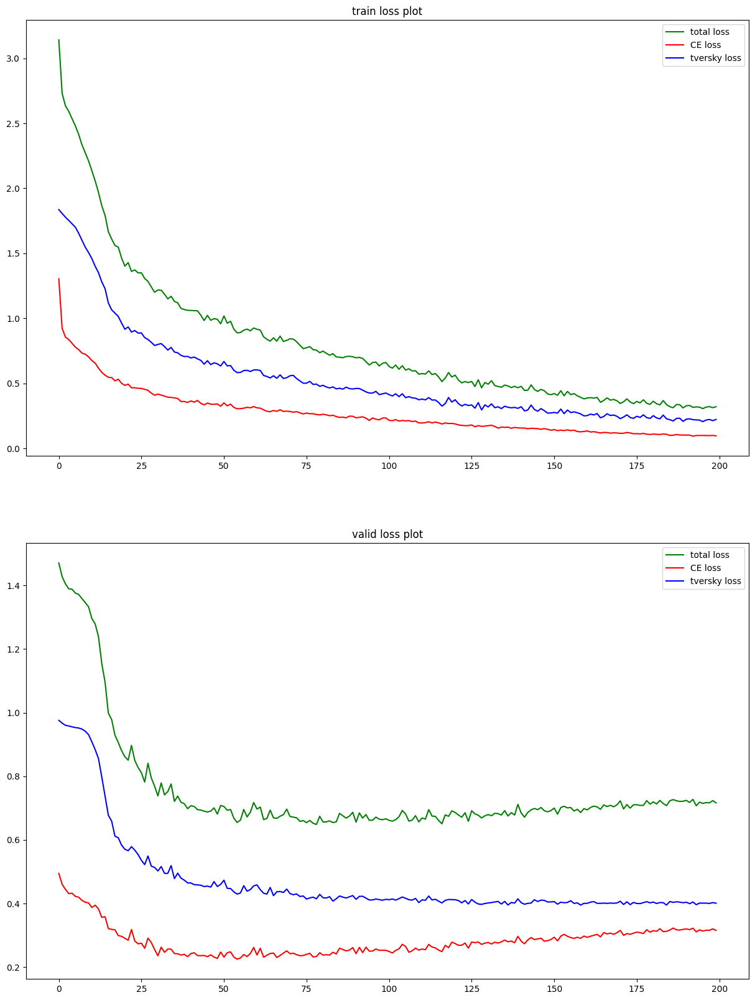

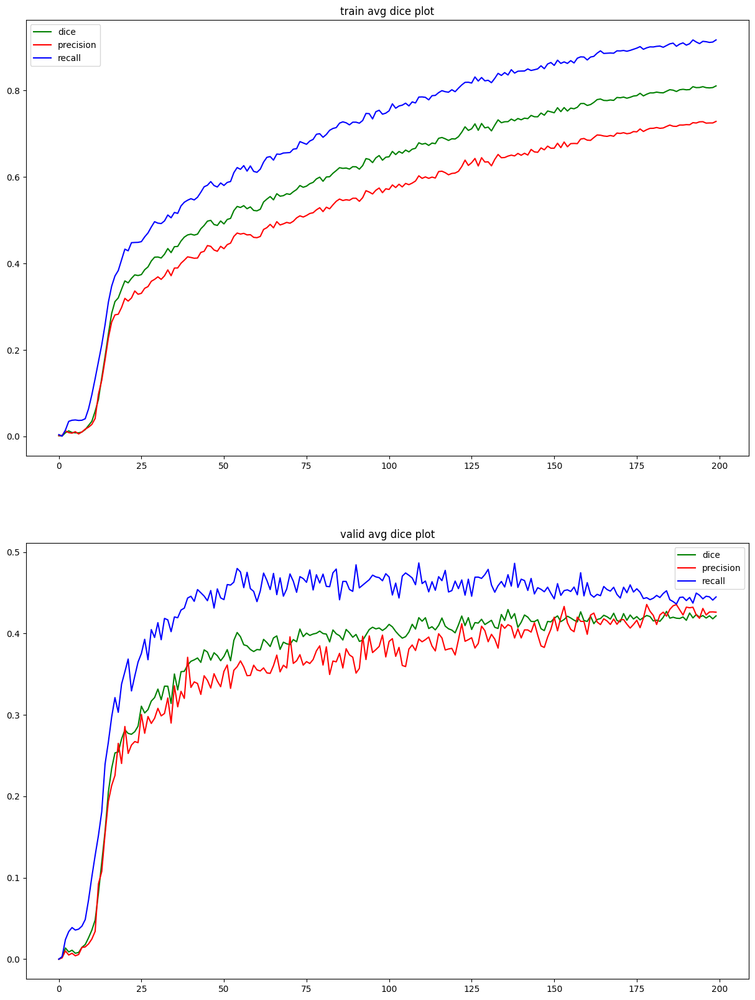

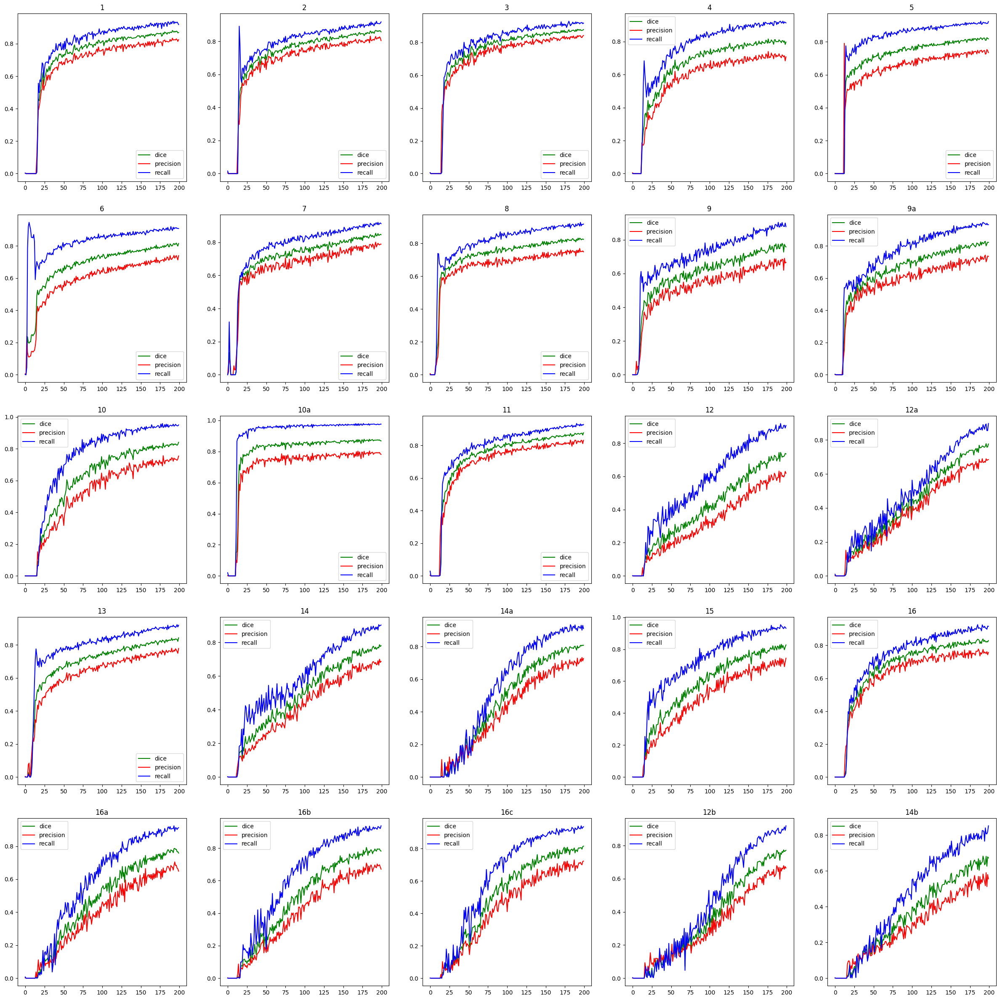

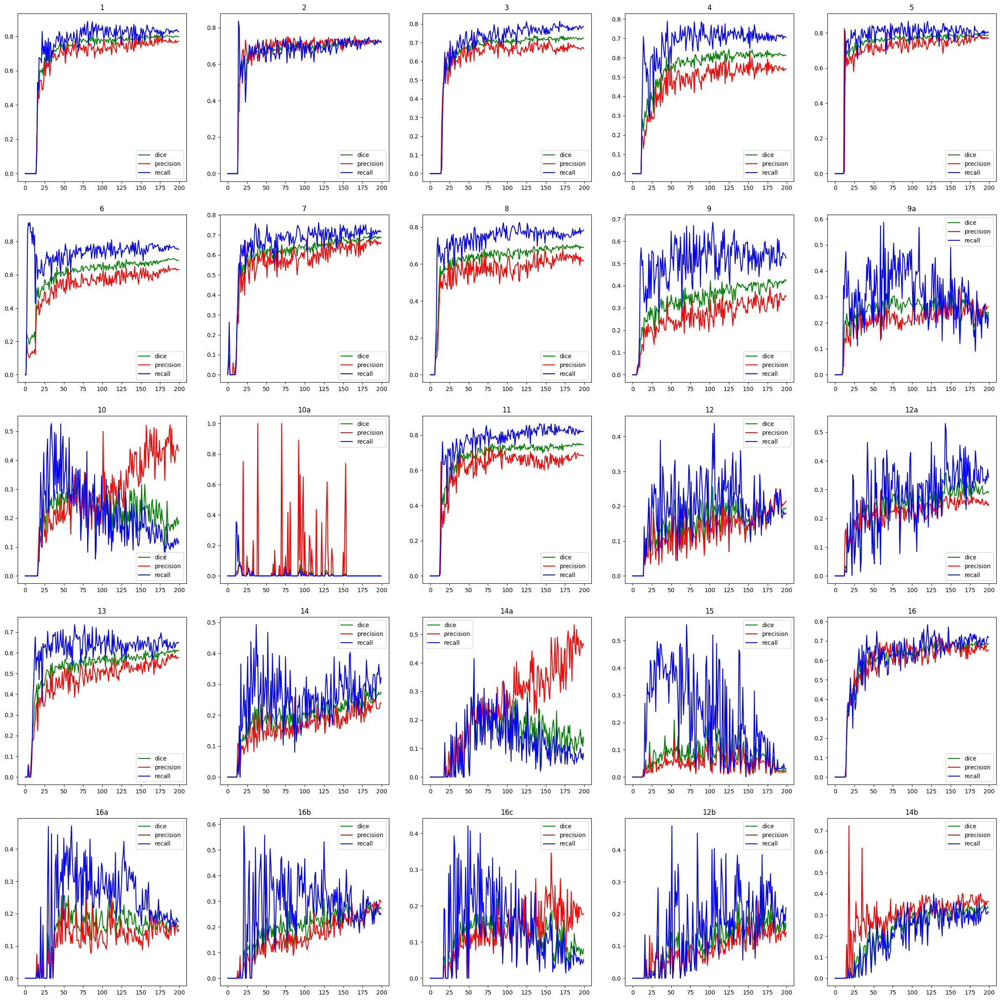

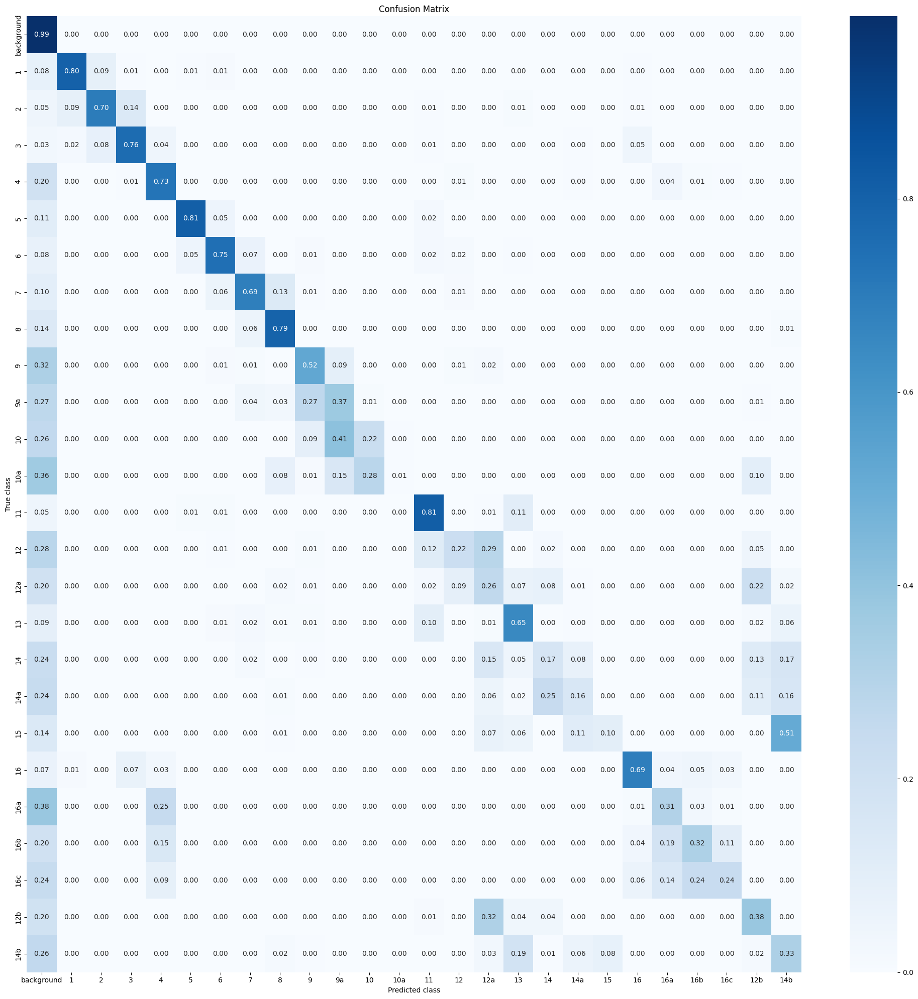

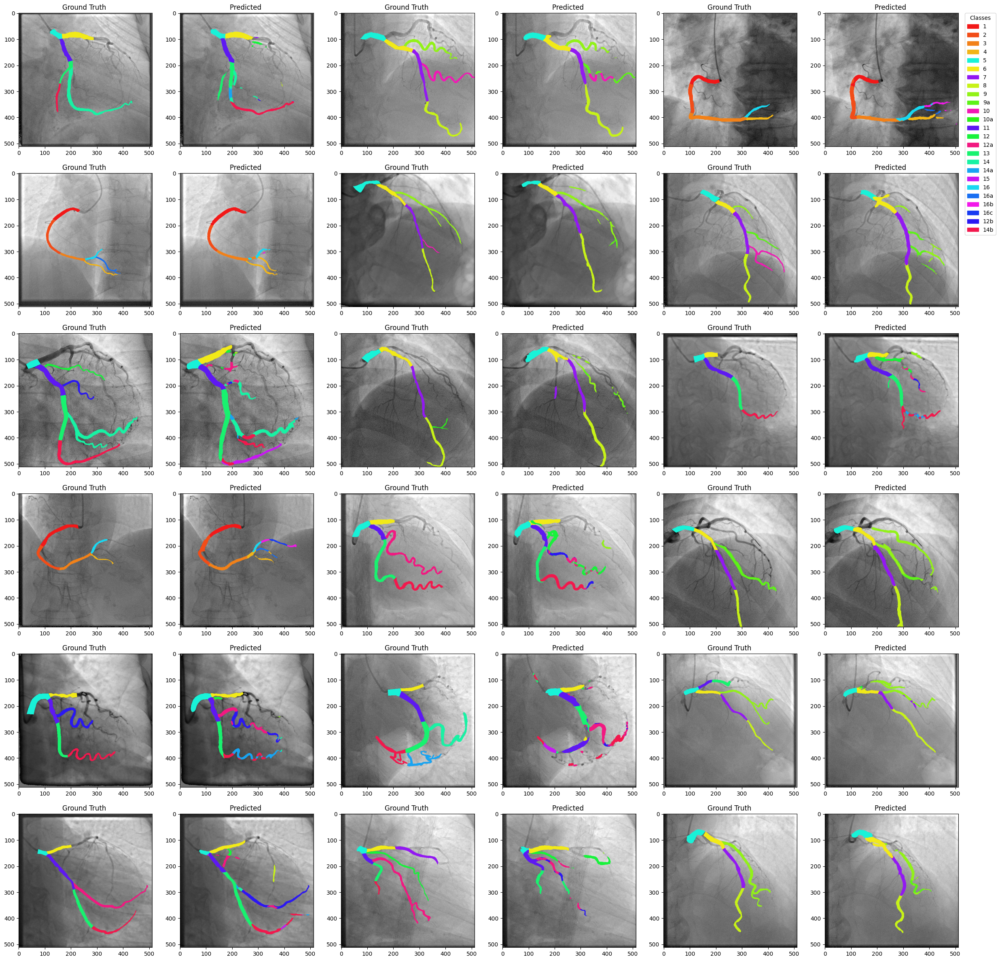

In [10]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    args=args,
    class_map=class_map,
    name=args["name"]
)